## MAIN

In [ ]:
# --- SETUP -Onetime---
!apt-get update -y
!apt-get install -y poppler-utils
!pip install pdf2image opencv-python pillow pytesseract


Hit:1 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:2 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:3 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:4 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:5 https://cli.github.com/packages stable InRelease
Hit:6 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:7 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:8 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading packag

In [ ]:
import cv2
import numpy as np
from pdf2image import convert_from_path
from PIL import Image
import os

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# --- CONFIG ---
PDF_PATH = "/content/drive/MyDrive/ResumeParser/freshteams_resume/Resumes/AnirudhReddy_Resume.pdf"   # 🔹 change this to your input PDF path
FILE_NAME = os.path.splitext(os.path.basename(PDF_PATH))[0].split('.')[0]
OUTPUT_DIR = f"/content/drive/MyDrive/ResumeParser/processed_pages/{FILE_NAME}"
os.makedirs(OUTPUT_DIR, exist_ok=True)
print(FILE_NAME)

# --- 1️⃣ Convert PDF pages to images (A4 @ 300 DPI) ---
pages = convert_from_path(PDF_PATH, dpi=300, fmt='png')  # high-quality PNGs

print(f"Converted {len(pages)} page(s)")

# --- Helper: Resize image to A4 @ 300 DPI ---
def resize_to_a4(img_pil):
    A4_WIDTH_PX = int(8.27 * 300)  # 8.27 inches = 210 mm
    A4_HEIGHT_PX = int(11.69 * 300)
    return img_pil.resize((A4_WIDTH_PX, A4_HEIGHT_PX), Image.LANCZOS)

processed_paths = []

for i, page in enumerate(pages, start=1):

    # --- Convert to grayscale ---
    page = resize_to_a4(page)
    gray = cv2.cvtColor(np.array(page), cv2.COLOR_RGB2GRAY)

    # --- 2️⃣ Binarization (Otsu) ---
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # --- 3️⃣ Margin Removal ---
    # Invert colors so text = 1, background = 0
    inv = cv2.bitwise_not(binary)

    # Find contours and get bounding box of content
    coords = cv2.findNonZero(inv)
    x, y, w, h = cv2.boundingRect(coords)

    # Crop to content region
    cropped = binary[y:y+h, x:x+w]

    # --- 4️⃣ Page Layout Normalization (fit to A4 @ 300 DPI) ---
    # Create white A4 canvas and center the cropped content
    A4_WIDTH_PX = int(8.27 * 300)
    A4_HEIGHT_PX = int(11.69 * 300)
    normalized = np.ones((A4_HEIGHT_PX, A4_WIDTH_PX), dtype=np.uint8) * 255

    # Scale down content if larger than A4
    scale = min(A4_WIDTH_PX / w, A4_HEIGHT_PX / h, 1.0)
    new_w, new_h = int(w * scale), int(h * scale)
    resized = cv2.resize(cropped, (new_w, new_h), interpolation=cv2.INTER_AREA)

    # Center paste
    x_off = (A4_WIDTH_PX - new_w) // 2
    y_off = (A4_HEIGHT_PX - new_h) // 2
    normalized[y_off:y_off+new_h, x_off:x_off+new_w] = resized

    # --- Save processed page ---
    out_path = os.path.join(OUTPUT_DIR, f"{FILE_NAME}_{i:02d}.png")
    cv2.imwrite(out_path, normalized)
    processed_paths.append(out_path)

print("✅ Preprocessing complete. Processed images saved to:", out_path)

# --- Load all processed pages ---
images = [Image.open(p) for p in processed_paths]

# --- Get total height and max width for the final long image ---
total_height = sum(img.height for img in images)
max_width = max(img.width for img in images)

# --- Create new blank white canvas ---
long_image = Image.new('L', (max_width, total_height), color=255)  # 'L' = grayscale

# --- Paste each page sequentially ---
y_offset = 0
for img in images:
    long_image.paste(img, (0, y_offset))
    y_offset += img.height

# --- Save the stitched image ---
long_image_path = os.path.join(OUTPUT_DIR, f"{FILE_NAME}_stitched.png")
long_image.save(long_image_path)
print("✅ Stitched image saved at:", long_image_path)



AnirudhReddy_Resume
Converted 1 page(s)
✅ Preprocessing complete. Processed images saved to: /content/drive/MyDrive/ResumeParser/processed_pages/AnirudhReddy_Resume/AnirudhReddy_Resume_01.png
✅ Stitched image saved at: /content/drive/MyDrive/ResumeParser/processed_pages/AnirudhReddy_Resume/AnirudhReddy_Resume_stitched.png


Found 33 lines, top candidates:
179 197 h= 19 w= 91 len_px= 91 area= 715 fill= 0.414 ar= 4.79 sp_above= 18 align= left score= 4.0 chars= 7 words= 1 ocr= SUMMARY
347 367 h= 21 w= 238 len_px= 238 area= 1664 fill= 0.333 ar= 11.33 sp_above= 24 align= left score= 4.0 chars= 23 words= 3 ocr= SKILLS & QUALIFICATIONS
467 486 h= 20 w= 260 len_px= 260 area= 1853 fill= 0.356 ar= 13.0 sp_above= 18 align= left score= 4.0 chars= 23 words= 2 ocr= PROFESSIONAL EXPERIENCE
213 323 h= 111 w= 882 len_px= 882 area= 17692 fill= 0.181 ar= 7.95 sp_above= 16 align= center score= 3.0 chars= 21 words= 6 ocr= Soh me ce = semana co
383 449 h= 67 w= 881 len_px= 881 area= 9736 fill= 0.165 ar= 13.15 sp_above= 16 align= center score= 3.0 chars= 62 words= 14 ocr= eral, Arie Prete, Gafna £2, 3, VPC. AL, AVIS Cov, A, Sk, Az, J
502 543 h= 42 w= 857 len_px= 857 area= 5794 fill= 0.161 ar= 20.4 sp_above= 16 align= center score= 3.0 chars= 95 words= 14 ocr= pv Ops Engineer | AWS/Kubernetes/Docker | Technomold IT Solutions | B

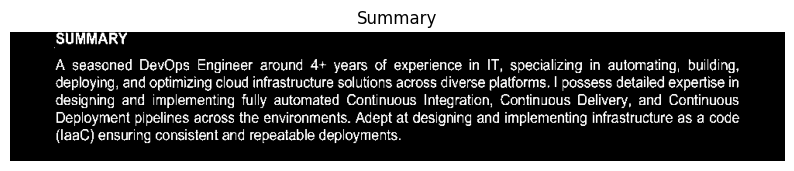

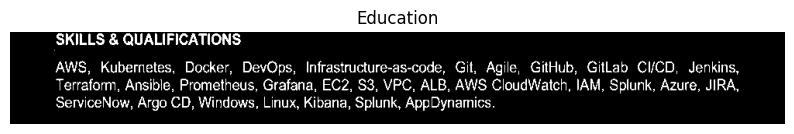

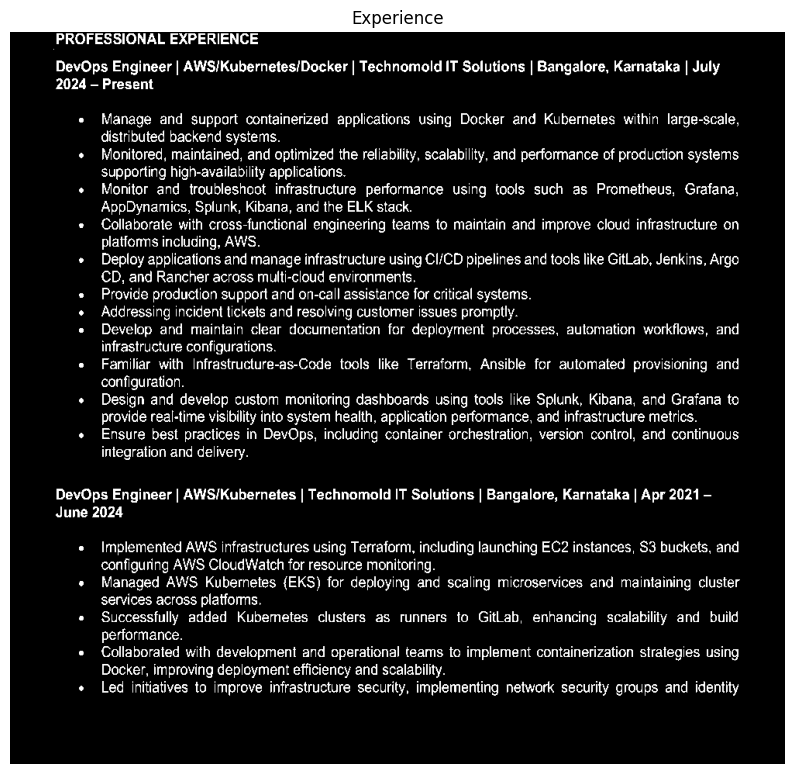

In [ ]:
import cv2
import numpy as np
from scipy.ndimage import gaussian_filter1d
import matplotlib.pyplot as plt
import pandas as pd
import re
import os

# ---------- UTIL: display ----------
def show(img, title="", figsize=(10,15), cmap='gray'):
    plt.figure(figsize=figsize)
    plt.imshow(img, cmap=cmap)
    plt.title(title)
    plt.axis('off')
    plt.show()


# Optional OCR
try:
    import pytesseract
    OCR_AVAILABLE = True
except Exception:
    OCR_AVAILABLE = False

# --- Helpers --- #
def load_and_preprocess(path, invert=True, scale_w=1000):
    """Load image, resize, grayscale, binarize, optional invert."""
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"Could not read image: {path}")
    h, w = img.shape
    scale = scale_w / float(w)
    img = cv2.resize(img, (scale_w, int(h*scale)), interpolation=cv2.INTER_AREA)
    _, bw = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    if invert:
        bw = 255 - bw
    return bw

def remove_lines(bw):
    """Remove long horizontal and vertical lines."""
    h, w = bw.shape
    out = bw.copy()
    horiz_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (int(w*0.5), 1))
    detected_h = cv2.morphologyEx(out, cv2.MORPH_OPEN, horiz_kernel)
    out = cv2.subtract(out, detected_h)

    vert_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, max(3, int(h*0.5))))
    detected_v = cv2.morphologyEx(out, cv2.MORPH_OPEN, vert_kernel)
    out = cv2.subtract(out, detected_v)
    return out

def projections(bw):
    hproj = bw.sum(axis=1) / 255
    vproj = bw.sum(axis=0) / 255
    return hproj, vproj

def smooth(arr, sigma=2):
    return gaussian_filter1d(arr.astype(float), sigma=sigma)

def find_text_bands(hproj_sm, min_height=3, thresh_ratio=0.05):
    h = len(hproj_sm)
    thresh = np.max(hproj_sm) * thresh_ratio
    mask = hproj_sm > thresh
    bands = []
    i = 0
    while i < h:
        if mask[i]:
            start = i
            while i < h and mask[i]:
                i += 1
            end = i-1
            if (end - start + 1) >= min_height:
                bands.append((start, end))
        else:
            i += 1
    return bands

def bbox_from_band(bw, band):
    y1, y2 = band
    col_sum = bw[y1:y2+1, :].sum(axis=0) / 255
    cols = np.where(col_sum > 0)[0]
    if cols.size == 0:
        return None
    x1, x2 = cols[0], cols[-1]
    return (x1, y1, x2, y2)

def compute_line_features(bw, bbox):
    x1, y1, x2, y2 = bbox
    patch = bw[y1:y2+1, x1:x2+1]
    w = x2 - x1 + 1
    h = y2 - y1 + 1
    area = patch.sum() / 255
    density = area / (w*h) if (w*h) > 0 else 0.0
    cx = (x1 + x2)/2.0
    aspect_ratio = (w / float(h)) if h > 0 else 0.0  # NEW: ratio (w/h)
    return {
        'x1': x1, 'y1': y1, 'x2': x2, 'y2': y2,
        'w': w, 'h': h,
        'area': area,            # pixel area (white pixels in bw patch)
        'density': density,      # fill ratio (area / bbox area)
        'cx': cx,
        'aspect_ratio': aspect_ratio  # NEW
    }

# --- Heading detection --- #
def detect_headings(path, use_ocr=True, debug=False):
    bw = load_and_preprocess(path)
    bw = remove_lines(bw)
    hproj, vproj = projections(bw)
    hproj_sm = smooth(hproj, sigma=2)
    bands = find_text_bands(hproj_sm, min_height=2, thresh_ratio=0.02)

    lines = []
    for b in bands:
        bbox = bbox_from_band(bw, b)
        if bbox is None:
            continue
        feats = compute_line_features(bw, bbox)
        lines.append(feats)

    if not lines:
        return [], bw

    # Global stats
    heights = np.array([l['h'] for l in lines])
    mean_h = heights.mean()
    std_h = heights.std()
    lines_sorted = sorted(lines, key=lambda r: r['y1'])

    # Compute spacing and alignment
    for i, l in enumerate(lines_sorted):
        above = l['y1'] - (lines_sorted[i-1]['y2'] if i>0 else 0)
        below = (lines_sorted[i+1]['y1'] if i<len(lines_sorted)-1 else bw.shape[0]) - l['y2']
        l['space_above'] = above
        l['space_below'] = below
        l['alignment'] = 'center' if abs(l['cx'] - bw.shape[1]/2) < bw.shape[1]*0.15 else ('left' if l['cx']<bw.shape[1]/2 else 'right')

    # Scoring
    candidates = []
    for l in lines_sorted:
        score = 0.0
        if l['h'] > mean_h*1.2: score += 1.2
        if l['space_above'] > np.median([x['space_above'] for x in lines_sorted])*1.5: score += 1.0
        if l['density'] > 0.02: score += 0.5
        if l['alignment'] == 'center': score += 0.3

        text = ""
        if use_ocr and OCR_AVAILABLE:
            x1,y1,x2,y2 = int(l['x1']),int(l['y1']),int(l['x2']),int(l['y2'])
            roi = 255 - bw[y1:y2+1, x1:x2+1]
            config = '--psm 7'
            text = pytesseract.image_to_string(roi, config=config).strip()
            up = sum(1 for c in text if c.isupper())
            if text:
                kw = ['education','experience','skills','projects','summary','certifications','contact','work']
                if any(k in text.lower() for k in kw): score += 2.0
                if len(text)>0 and up/max(1,len(text))>0.4: score += 0.5

        # NEW: store heading lengths and ratios
        l['ocr'] = text
        l['text_len_chars'] = len(text)
        l['text_len_words'] = len(text.split()) if text else 0
        l['length_px'] = l['w']  # visual length in pixels
        l['score'] = score
        candidates.append(l)

    candidates = sorted(candidates, key=lambda x: x['score'], reverse=True)

    if debug:
        print(f"Found {len(candidates)} lines, top candidates:")
        for c in candidates[:15]:
            print(
                c['y1'], c['y2'],
                "h=", c['h'],
                "w=", c['w'],
                "len_px=", c['length_px'],
                "area=", int(c['area']),
                "fill=", round(c['density'],3),
                "ar=", round(c['aspect_ratio'],2),
                "sp_above=", c['space_above'],
                "align=", c['alignment'],
                "score=", round(c['score'],2),
                "chars=", c['text_len_chars'],
                "words=", c['text_len_words'],
                "ocr=", c.get('ocr','')
            )

    return candidates, bw

# --- Name & Section Extraction --- #
def extract_name_and_sections_final(candidates):
    if not candidates:
        return None, [], []

    candidates = sorted(candidates, key=lambda x: x['y1'])
    top_n = max(1, len(candidates)//5)
    top_candidates = candidates[:top_n]

    def is_contact_line(text):
        return bool(re.search(r'[\w\.-]+@[\w\.-]+|\+?\d{7,}|linkedin\.com', text.lower()))

    # Detect name
    name_candidate = None
    for c in top_candidates:
        text = c.get('ocr','').strip()
        if text and not is_contact_line(text):
            name_candidate = c
            break
    if not name_candidate:
        name_candidate = max(top_candidates, key=lambda x: (x['h'], x['density']))
    name_text = name_candidate.get('ocr','').strip()

    # Contact lines
    contact_lines = []
    name_y2 = name_candidate['y2']
    for c in candidates:
        if c['y1'] > name_y2 and is_contact_line(c.get('ocr','')):
            contact_lines.append(c.get('ocr','').strip())

    # Section headings
    scores = [c['score'] for c in candidates]
    median_score = np.median(scores)
    median_height = np.median([c['h'] for c in candidates])
    median_space = np.median([c['space_above'] for c in candidates])
    print("Median score:", median_score)
    print("Median height:", median_height)
    print("Median space:", median_space)

    section_candidates = []
    for c in candidates:
        if c == name_candidate or c.get('ocr','').strip() in contact_lines:
            continue
        text = c.get('ocr','').strip()
        if (c['score'] >= 1.1*median_score and
            c['h'] <= 1.5*median_height and
            c['text_len_chars'] >=2 and c['text_len_chars'] <= 30 and
            c['density'] >= 0.05 and
            c['space_above'] >= 0.5*median_space and
            len(text.split()) <= 6):
            section_candidates.append(c)

    section_candidates = sorted(section_candidates, key=lambda x: x['y1'])
    headings_text = [c.get('ocr','').strip() for c in section_candidates]

    return name_text, contact_lines, headings_text, section_candidates

# --- Section Mapping --- #
SECTIONS = {
    "Summary": ["summary","professional summary","career summary","profile","about me","executive summary","personal profile","introduction","career objective","objective","professional profile","career overview","personal statement"],
    "Experience": ["experience","work experience","work history","professional experience","employment history","career history","relevant experience","industry experience","internship experience","practical experience","volunteer experience","freelance experience","project experience","consulting experience","military experience"],
    "Education": ["education","qualifications","academic background","academics","educational qualifications","academic qualifications","academic history","training and education","educational background","college education","schooling","coursework","academic achievements","research and education"],
    "Skills": ["skills","technical skills","key skills","technical expertise","core competencies","competencies","areas of expertise","professional skills","hard skills","soft skills","language skills","computer skills","programming languages","tools and technologies","methodologies","frameworks","strengths","capabilities","technical proficiency"],
    "Projects": ["projects","project highlights","key projects","selected projects","major projects","academic projects","research projects","open source projects","client projects","independent projects","case studies","portfolio projects","course projects","personal projects"],
    "Achievements": ["achievements","awards","honors","recognitions","distinctions","milestones","accomplishments","notable achievements","career highlights"],
    "Certifications": ["certifications","licenses","courses","training","professional development","workshops","online courses","continuing education","special training","technical certifications"],
    "Hobbies": ["hobbies","interests","personal interests","extracurricular activities","outside interests","personal pursuits","leisure activities"],
    "Publications": ["publications","research papers","journal articles","conference papers","books","book chapters","academic publications","white papers"],
    "Volunteer": ["volunteer","volunteering","community involvement","social work","philanthropy","community service","volunteer activities"],
    "Languages": ["languages","language proficiency","spoken languages","language skills"],
    "Research": ["research","research experience","research work","research summary","thesis","dissertation","research interests"],
    "References": ["references","referees","recommendations","testimonials"],
    "Public Speaking": ["public speaking","presentations","talks","seminars","conferences","speeches"],
    "Leadership": ["leadership","leadership experience","team leadership","management experience","organizational experience"],
    "Professional Development": ["professional development","training","workshops","seminars","courses"],
    "Memberships": ["memberships","professional memberships","associations","affiliations","societies","clubs"],
    "Patents": ["patents","intellectual property","inventions"],
    "Portfolio": ["portfolio","creative work","design portfolio","work samples","artwork"],
    "Objectives": ["objective","career objective","professional objective","goals","career goals","mission statement"],
    "Contact Information": ["contact information","contact details","personal details","bio","basic information"],
}

# Flatten mapping for quick lookup
SECTION_MAP = {kw.lower():sec for sec, kws in SECTIONS.items() for kw in kws}

# --- Section Image Splitter --- #
def split_sections_image(bw, section_candidates, headings_text):
    """Return dict of section_name -> section_image (numpy array)."""
    sections_imgs = {}
    h_total = bw.shape[0]

    for i, c in enumerate(section_candidates):
        sec_name = headings_text[i].lower()
        mapped = None
        for kw, sec in SECTION_MAP.items():
            if kw in sec_name:
                mapped = sec
                break
        if mapped is None:
            mapped = sec_name.title()
        y1 = c['y1']
        y2 = section_candidates[i+1]['y1']-1 if i<len(section_candidates)-1 else h_total-1
        sec_img = bw[y1:y2, :]
        sections_imgs[mapped] = sec_img

    return sections_imgs

# --- Example usage --- #
if __name__ == "__main__":
    path = "/content/drive/MyDrive/ResumeParser/processed_pages/Govindarao_resume_01.png"  # replace with your path
    candidates, bw = detect_headings(path, use_ocr=True, debug=True)
    name, contacts, headings_text, section_candidates = extract_name_and_sections_final(candidates)

    print("\nName:", name)
    print("Contacts:", contacts)
    print("Sections in order:", headings_text)

    # NEW: Display per-heading metrics
    if section_candidates:
        print("\nHeading metrics:")
        for c in section_candidates:
            txt = c.get('ocr','').strip()
            print(
                f"- '{txt}': "
                f"w={c['w']}, h={c['h']}, len_px={c['length_px']}, "
                f"area={int(c['area'])}, fill_ratio={c['density']:.3f}, "
                f"aspect_ratio={c['aspect_ratio']:.2f}, "
                f"chars={c['text_len_chars']}, words={c['text_len_words']}"
            )

    sections_imgs = split_sections_image(bw, section_candidates, headings_text)
    for sec, img in sections_imgs.items():
        show(img, title=sec)


Found 46 lines, top candidates:
1357 1375 h= 19 w= 563 len_px= 563 area= 2069 fill= 0.193 ar= 29.63 sp_above= 12 align= center score= 3.8 chars= 72 words= 10 ocr= » Certified in Kafka, Redis, Cloud (LearnQuest), and MATLAB (MathWorks).
38 71 h= 34 w= 274 len_px= 274 area= 1759 fill= 0.189 ar= 8.06 sp_above= 38 align= center score= 3.5 chars= 11 words= 2 ocr= AYUSH KUMAR
107 124 h= 18 w= 105 len_px= 105 area= 511 fill= 0.27 ar= 5.83 sp_above= 12 align= left score= 3.5 chars= 10 words= 1 ocr= Experience
678 694 h= 17 w= 78 len_px= 78 area= 378 fill= 0.285 ar= 4.59 sp_above= 21 align= left score= 3.5 chars= 8 words= 1 ocr= Projects
757 775 h= 19 w= 836 len_px= 836 area= 2606 fill= 0.164 ar= 44.0 sp_above= 4 align= center score= 2.8 chars= 114 words= 17 ocr= + Designed a minimal front-end with HTMX and Bootstrap for dynamic UT updates without heavy JavaScript frameworks.
780 798 h= 19 w= 678 len_px= 678 area= 2329 fill= 0.181 ar= 35.68 sp_above= 5 align= center score= 2.8 chars= 96 words= 

/tmp/ipython-input-2131514475.py:77: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(df['Heading'], rotation=45, ha='right')
/tmp/ipython-input-2131514475.py:77: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(df['Heading'], rotation=45, ha='right')
/tmp/ipython-input-2131514475.py:77: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(df['Heading'], rotation=45, ha='right')
/tmp/ipython-input-2131514475.py:77: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(df['Heading'], rotation=45, ha='right')
/tmp/ipython-input-2131514475.py:77: UserWarning: set_ticklabels() should only be used with a fi

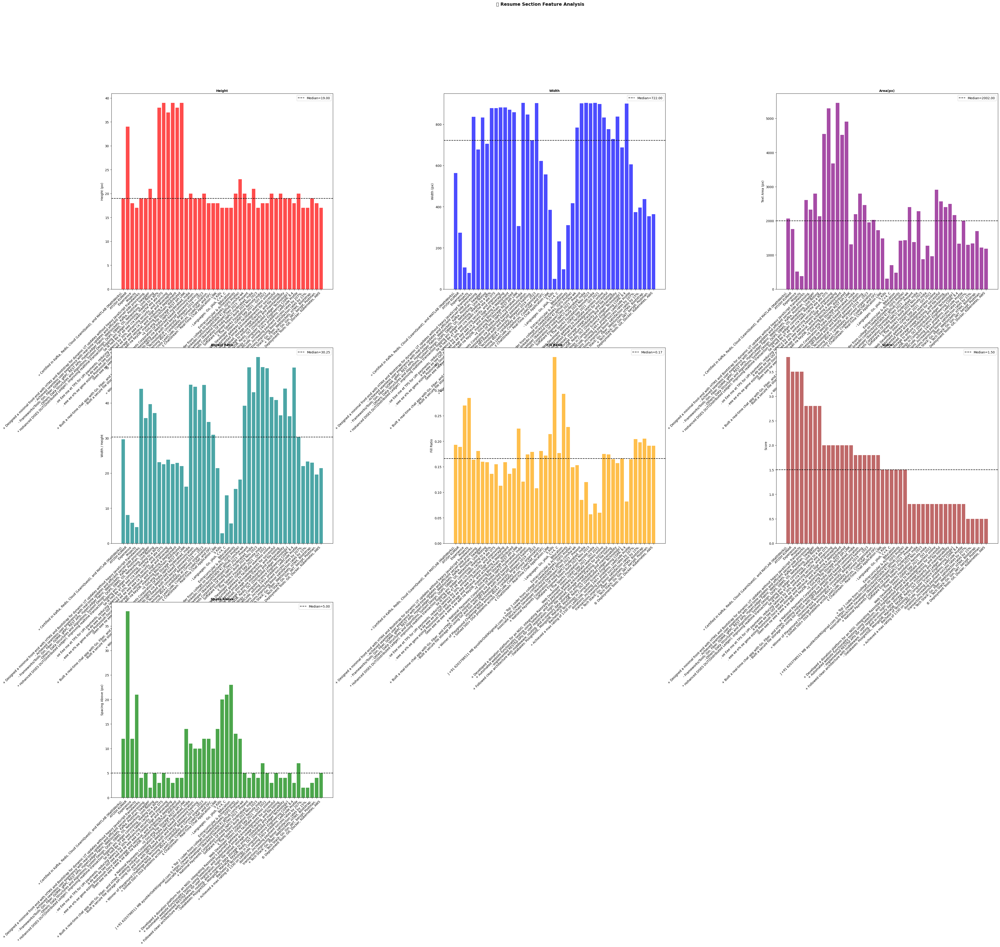

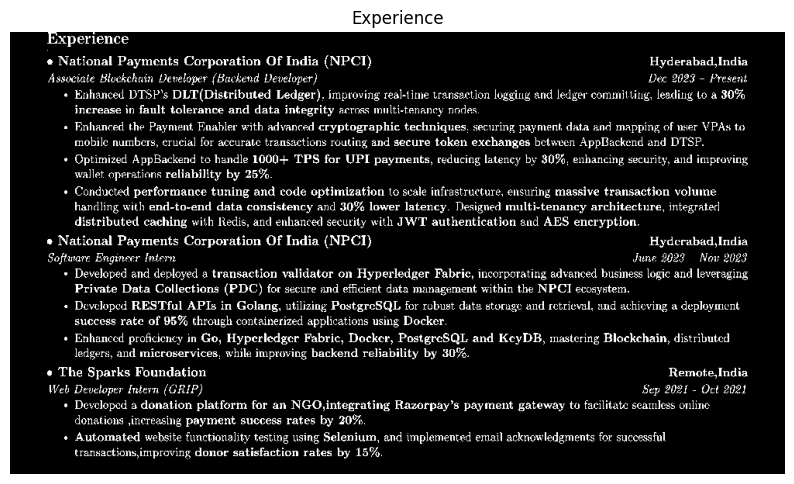

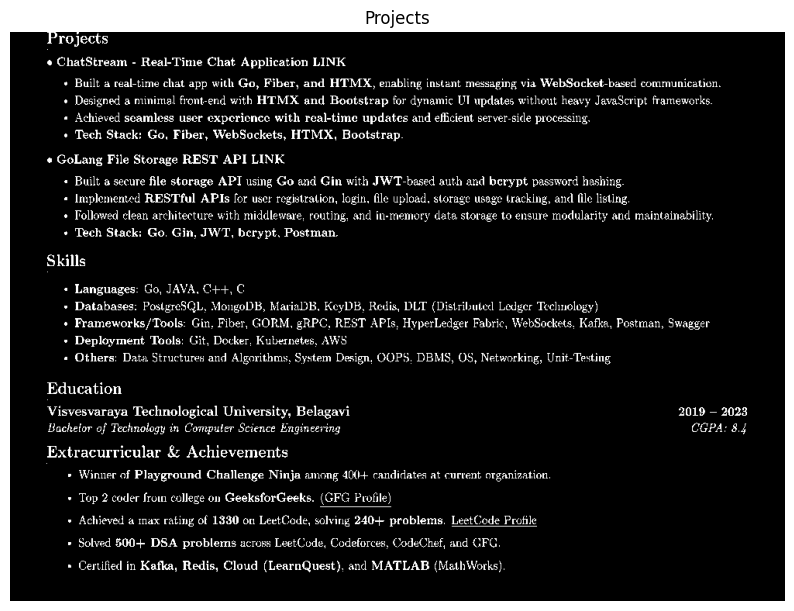

In [ ]:
if __name__ == "__main__":
    path = processed_paths[0]  # replace with your path

    # --- Detect headings ---
    candidates, bw = detect_headings(path, use_ocr=True, debug=True)
    name, contacts, headings_text, section_candidates = extract_name_and_sections_final(candidates)

    print("\n============================")
    print("📄 RESUME STRUCTURE SUMMARY")
    print("============================")
    print(f"Name: {name}")
    print(f"Contacts: {contacts}")
    print(f"Detected Sections (order): {headings_text}")
    print("============================\n")

    # --- Display per-heading metrics neatly ---
    if candidates:
        df = pd.DataFrame([{
            'Heading': c.get('ocr','').strip(),
            'Height': c['h'],
            'Width': c['w'],
            'Aspect Ratio': round(c['aspect_ratio'], 2),
            'Area(px)': int(c['area']),
            'Fill Ratio': round(c['density'], 3),
            'Space Above': c['space_above'],
            'Score': round(c['score'], 2),
            'Chars': c['text_len_chars'],
            'Words': c['text_len_words']
        } for c in candidates])

        # Sort by vertical position if available
        df = df[df['Heading'] != ""].reset_index(drop=True)

        print("🧭 Section Metrics:\n")
        print(df.to_string(index=False))

        # --- Calculate medians ---
        med_height = df['Height'].median()
        med_width = df['Width'].median()
        med_area = df['Area(px)'].median()
        med_aspect = df['Aspect Ratio'].median()
        med_fill = df['Fill Ratio'].median()
        med_space = df['Space Above'].median()
        med_score = df['Score'].median()

        print("\n📊 Calculated Medians:")
        print(f"Median Height: {med_height:.2f}")
        print(f"Median Width: {med_width:.2f}")
        print(f"Median Area: {med_area:.2f}")
        print(f"Median Aspect Ratio: {med_aspect:.2f}")
        print(f"Median Fill Ratio: {med_fill:.3f}")
        print(f"Median Space Above: {med_space:.2f}")
        print(f"Median Score: {med_score:.2f}")

        # --- Combined Dashboard ---
        metrics = [
            ('Height', med_height, 'r', "Height (px)"),
            ('Width', med_width, 'b', "Width (px)"),
            ('Area(px)', med_area, 'purple', "Text Area (px)"),
            ('Aspect Ratio', med_aspect, 'teal', "Width / Height"),
            ('Fill Ratio', med_fill, 'orange', "Fill Ratio"),
            ('Score', med_score, 'brown', "Score"),
            ('Space Above', med_space, 'green', "Spacing Above (px)")
        ]

        fig, axes = plt.subplots(3, 3, figsize=(50, 40))
        axes = axes.flatten()
        plt.subplots_adjust(hspace=0.3, wspace=0.5)

        for i, (col, med, color, ylabel) in enumerate(metrics):
            if i >= len(axes): break
            ax = axes[i]
            ax.bar(df['Heading'], df[col], color=color, alpha=0.7)
            ax.axhline(med, color='k', linestyle='--', label=f'Median={med:.2f}')
            ax.set_title(col, fontsize=10, weight='bold')
            ax.set_ylabel(ylabel)
            ax.set_xticklabels(df['Heading'], rotation=45, ha='right')
            ax.legend()

        # Hide extra subplots
        for j in range(len(metrics), len(axes)):
            fig.delaxes(axes[j])

        fig.suptitle("📊 Resume Section Feature Analysis", fontsize=14, weight='bold')
        plt.show()

    # --- Split and visualize sections ---
    sections_imgs = split_sections_image(bw, section_candidates, headings_text)
    for sec, img in sections_imgs.items():
        show(img, title=sec)

In [ ]:
import os
import re
import json
from typing import List, Tuple, Dict, Any, Optional

import cv2
import numpy as np
from PIL import Image
from pdf2image import convert_from_path
import matplotlib.pyplot as plt

# Optional OCR
try:
    import pytesseract
    OCR_AVAILABLE = True
except Exception:
    OCR_AVAILABLE = False

# ----------------------------
# Config
# ----------------------------
DPI = 300
A4_WIDTH_PX = int(8.27 * DPI)
A4_HEIGHT_PX = int(11.69 * DPI)

SECTIONS = {
    "Summary": ["summary","professional summary","career summary","profile","about me","executive summary","personal profile","introduction","career objective","objective","professional profile","career overview","personal statement"],
    "Experience": ["experience","work experience","work history","professional experience","employment history","career history","relevant experience","industry experience","internship experience","practical experience","volunteer experience","freelance experience","project experience","consulting experience","military experience"],
    "Education": ["education","qualifications","academic background","academics","educational qualifications","academic history","training and education","educational background","college education","schooling","coursework","academic achievements","research and education"],
    "Skills": ["skills","technical skills","key skills","technical expertise","core competencies","competencies","areas of expertise","professional skills","hard skills","soft skills","language skills","computer skills","programming languages","tools and technologies","methodologies","frameworks","strengths","capabilities","technical proficiency"],
    "Projects": ["projects","project highlights","key projects","selected projects","major projects","academic projects","research projects","open source projects","client projects","independent projects","case studies","portfolio projects","course projects","personal projects"],
    "Achievements": ["achievements","awards","honors","recognitions","distinctions","milestones","accomplishments","notable achievements","career highlights"],
    "Certifications": ["certifications","licenses","courses","training","professional development","workshops","online courses","continuing education","special training","technical certifications"],
    "Hobbies": ["hobbies","interests","personal interests","extracurricular activities","outside interests","personal pursuits","leisure activities"],
    "Publications": ["publications","research papers","journal articles","conference papers","books","book chapters","academic publications","white papers"],
    "Volunteer": ["volunteer","volunteering","community involvement","social work","philanthropy","community service","volunteer activities"],
    "Languages": ["languages","language proficiency","spoken languages","language skills"],
    "Research": ["research","research experience","research work","research summary","thesis","dissertation","research interests"],
    "References": ["references","referees","recommendations","testimonials"],
    "Public Speaking": ["public speaking","presentations","talks","seminars","conferences","speeches"],
    "Leadership": ["leadership","leadership experience","team leadership","management experience","organizational experience"],
    "Professional Development": ["professional development","training","workshops","seminars","courses"],
    "Memberships": ["memberships","professional memberships","associations","affiliations","societies","clubs"],
    "Patents": ["patents","intellectual property","inventions"],
    "Portfolio": ["portfolio","creative work","design portfolio","work samples","artwork"],
    "Objectives": ["objective","career objective","professional objective","goals","career goals","mission statement"],
    "Contact Information": ["contact information","contact details","personal details","bio","basic information"],
}
SECTION_MAP = {kw.lower(): sec for sec, kws in SECTIONS.items() for kw in kws}

CONTACT_RE = re.compile(r'([\w\.-]+@[\w\.-]+|\+?\d[\d\s\-\(\)]{7,})|(linkedin\.com|github\.com|bit\.ly|portfolio|stackoverflow\.com|twitter\.com)', re.I)

# ----------------------------
# Utilities
# ----------------------------
def resize_to_a4(img_pil: Image.Image) -> Image.Image:
    return img_pil.resize((A4_WIDTH_PX, A4_HEIGHT_PX), Image.LANCZOS)

def to_bw_uint8(img_gray: np.ndarray) -> np.ndarray:
    # Binarize with Otsu
    _, bw = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return bw  # text=0 bg=255

def bw255_to01(bw255: np.ndarray) -> np.ndarray:
    return (bw255 == 255).astype(np.uint8)  # text=0 bg=1

def bw01_to255(bw01: np.ndarray) -> np.ndarray:
    return (bw01 * 255).astype(np.uint8)

def safe_crop(img: np.ndarray, y1: int, y2: int, x1: int, x2: int) -> np.ndarray:
    y1 = max(0, y1); x1 = max(0, x1)
    y2 = min(img.shape[0], y2); x2 = min(img.shape[1], x2)
    if y2 <= y1 or x2 <= x1:
        return img[0:0, 0:0]
    return img[y1:y2, x1:x2]

def save_img(path: str, img_bw255: np.ndarray) -> None:
    os.makedirs(os.path.dirname(path), exist_ok=True)
    cv2.imwrite(path, img_bw255)

def show_images_grid(image_paths: List[str], cols: int = 2, title: str = "Sections"):
    imgs = [Image.open(p).convert("L") for p in image_paths if os.path.exists(p)]
    if not imgs:
        return
    rows = (len(imgs) + cols - 1) // cols
    plt.figure(figsize=(cols * 5, rows * 5))
    for i, img in enumerate(imgs, 1):
        plt.subplot(rows, cols, i)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# ----------------------------
# OCR setup and helpers
# ----------------------------
def set_tesseract_cmd(tesseract_cmd: Optional[str]) -> None:
    global OCR_AVAILABLE
    if not OCR_AVAILABLE:
        return
    try:
        if tesseract_cmd:
            pytesseract.pytesseract.tesseract_cmd = tesseract_cmd
        _ = pytesseract.get_tesseract_version()
        OCR_AVAILABLE = True
    except Exception:
        OCR_AVAILABLE = False

def ocr_text(img_bw255: np.ndarray, psm: int = 6, lang: str = "eng") -> str:
    if not OCR_AVAILABLE or img_bw255.size == 0:
        return ""
    try:
        return pytesseract.image_to_string(img_bw255, config=f'--psm {psm}', lang=lang).strip()
    except Exception:
        return ""

def ocr_image_to_lines(img_bw255: np.ndarray, lang: str = "eng", min_conf: int = 40) -> List[Dict[str, Any]]:
    """
    Returns list of lines with bounding boxes using Tesseract data API.
    """
    if not OCR_AVAILABLE or img_bw255.size == 0:
        return []

    try:
        data = pytesseract.image_to_data(img_bw255, config='--psm 6', lang=lang, output_type=pytesseract.Output.DICT)
    except Exception:
        return []

    n = len(data.get("text", []))
    lines_map: Dict[Tuple[int,int,int], Dict[str, Any]] = {}
    for i in range(n):
        text = (data["text"][i] or "").strip()
        if not text:
            continue
        try:
            conf = int(float(data["conf"][i]))
        except Exception:
            conf = -1
        if conf < min_conf:
            continue
        block = data.get("block_num", [0]*n)[i]
        par = data.get("par_num", [0]*n)[i]
        line = data.get("line_num", [0]*n)[i]
        key = (block, par, line)
        left = int(data["left"][i]); top = int(data["top"][i])
        width = int(data["width"][i]); height = int(data["height"][i])
        right = left + width; bottom = top + height

        if key not in lines_map:
            lines_map[key] = {
                "text": text,
                "left": left, "top": top, "right": right, "bottom": bottom,
                "height": height, "width": width, "words": [text], "confs": [conf]
            }
        else:
            L = lines_map[key]
            L["text"] += " " + text
            L["left"] = min(L["left"], left)
            L["top"] = min(L["top"], top)
            L["right"] = max(L["right"], right)
            L["bottom"] = max(L["bottom"], bottom)
            L["height"] = L["bottom"] - L["top"]
            L["width"] = L["right"] - L["left"]
            L["words"].append(text)
            L["confs"].append(conf)

    lines = list(lines_map.values())
    lines.sort(key=lambda d: (d["top"], d["left"]))
    return lines

def uppercase_ratio(s: str) -> float:
    letters = [c for c in s if c.isalpha()]
    if not letters:
        return 0.0
    ups = sum(1 for c in letters if c.isupper())
    return ups / max(1, len(letters))

def normalize_text(s: str) -> str:
    return re.sub(r'\s+', ' ', s).strip()

def match_section_keyword(text: str) -> str:
    tl = text.lower()
    for kw, sec in SECTION_MAP.items():
        if kw in tl:
            return sec
    return ""

# ----------------------------
# Page preprocessing and column split
# ----------------------------
def detect_and_crop_margins(bin_img: np.ndarray, page_number_width: int = 30):
    h, w = bin_img.shape
    top = 0
    for i in range(h):
        if np.any(bin_img[i, :] == 0):
            top = i; break
    bottom = h - 1
    for i in reversed(range(h)):
        if np.any(bin_img[i, :] == 0):
            bottom = i; break
    left = 0
    for j in range(w):
        if np.any(bin_img[:, j] == 0):
            left = j; break
    right = w - 1
    for j in reversed(range(w)):
        if np.any(bin_img[:, j] == 0):
            right = j; break

    inv_img = 1 - bin_img
    found_page_number = False
    found_gap = False
    new_bottom = bottom
    for i in reversed(range(top, bottom + 1)):
        row_sum = int(np.sum(inv_img[i, :]))
        if row_sum >= page_number_width:
            break
        elif 0 < row_sum < page_number_width:
            found_page_number = True
        elif found_page_number and row_sum == 0:
            found_gap = True
        if found_page_number and found_gap and row_sum > 0:
            new_bottom = i
            break
    bottom = new_bottom

    cropped_img = bin_img[top:bottom+1, left:right+1]
    return cropped_img, (top, bottom, left, right)

def preprocess_page(pil_page: Image.Image) -> np.ndarray:
    page = resize_to_a4(pil_page)
    gray = cv2.cvtColor(np.array(page), cv2.COLOR_RGB2GRAY)
    bw255 = to_bw_uint8(gray)
    bw01 = bw255_to01(bw255)
    cropped01, _ = detect_and_crop_margins(bw01, page_number_width=30)
    cropped255 = bw01_to255(cropped01)

    norm = np.ones((A4_HEIGHT_PX, A4_WIDTH_PX), dtype=np.uint8) * 255
    ch, cw = cropped255.shape
    scale = min(A4_WIDTH_PX / cw, A4_HEIGHT_PX / ch, 1.0)
    new_w, new_h = max(1, int(cw * scale)), max(1, int(ch * scale))
    resized = cv2.resize(cropped255, (new_w, new_h), interpolation=cv2.INTER_AREA)
    x_off = (A4_WIDTH_PX - new_w) // 2
    y_off = (A4_HEIGHT_PX - new_h) // 2
    norm[y_off:y_off+new_h, x_off:x_off+new_w] = resized
    return norm

def find_axis_cuts_from_projection(
    proj_counts: np.ndarray,
    axis_len: int,
    gap_ratio: float = 0.04,
    smooth_win: int = 31,
    max_splits: int = 2,
    edge_guard_px: int = 20,
) -> List[int]:
    """
    More forgiving gap finder using a moving average.
    """
    if axis_len <= 0:
        return []
    k = max(5, min(smooth_win, axis_len // 20))
    kernel = np.ones(k, dtype=float) / k
    proj_sm = np.convolve(proj_counts.astype(float), kernel, mode='same')
    thresh = max(1.0, proj_sm.max() * 0.08)
    mask_content = (proj_sm > thresh).astype(np.uint8)
    # run-length
    rle = []
    prev = mask_content[0]; start = 0
    for i in range(1, len(mask_content)):
        if mask_content[i] != prev:
            rle.append((prev, start, i - start))
            prev = mask_content[i]; start = i
    rle.append((prev, start, len(mask_content) - start))
    min_gap_len = max(10, int(axis_len * gap_ratio))
    gaps = [(s, L) for (v, s, L) in rle if v == 0 and L >= min_gap_len and s > edge_guard_px and (s + L) < (axis_len - edge_guard_px)]
    gaps = sorted(gaps, key=lambda x: x[1], reverse=True)[:max_splits]
    cuts = sorted([s + (L // 2) for (s, L) in gaps])
    return cuts

def split_into_columns(bw255: np.ndarray, max_cols: int = 3) -> List[Tuple[np.ndarray, Tuple[int, int, int, int]]]:
    h, w = bw255.shape
    text_cols = (bw255 == 0).astype(np.uint8).sum(axis=0)
    cuts = find_axis_cuts_from_projection(text_cols, axis_len=w, gap_ratio=0.04, smooth_win=51, max_splits=max_cols - 1)
    xs = [0] + cuts + [w]
    cols = []
    for i in range(len(xs) - 1):
        x1, x2 = xs[i], xs[i + 1]
        col = safe_crop(bw255, 0, h, x1, x2)
        # filter very narrow
        if col.shape[1] >= max(200, int(0.18 * w)) or len(xs) == 2:
            cols.append((col, (0, h, x1, x2)))
    if not cols:
        cols = [(bw255, (0, h, 0, w))]
    return cols

# ----------------------------
# Header detection from OCR lines
# ----------------------------
def detect_headers_from_lines(lines: List[Dict[str, Any]], col_height: int) -> List[int]:
    if not lines:
        return []
    # compute medians
    heights = np.array([max(1, ln["height"]) for ln in lines])
    med_h = float(np.median(heights))
    spacings = []
    for i in range(1, len(lines)):
        spacings.append(lines[i]["top"] - lines[i-1]["bottom"])
    med_space = float(np.median(spacings)) if spacings else 12.0

    header_idxs = []
    for i, ln in enumerate(lines):
        t = normalize_text(ln["text"])
        if not t:
            continue
        if CONTACT_RE.search(t):
            continue

        kw_hit = bool(match_section_keyword(t))
        words = len(t.split())
        short = words <= 6
        up_ratio = uppercase_ratio(t)
        tall = ln["height"] >= (med_h * 1.25)
        gap_above = (ln["top"] - (lines[i-1]["bottom"] if i > 0 else 0))
        big_gap = gap_above >= max(12.0, 0.8 * med_space, 0.02 * col_height)

        likely = kw_hit or ((short and (up_ratio >= 0.55 or tall)) and big_gap)
        if likely:
            header_idxs.append(i)

    # dedup close headers
    dedup: List[int] = []
    for idx in header_idxs:
        if not dedup:
            dedup.append(idx)
        else:
            prev = dedup[-1]
            # if overlapping or within 8px, keep earlier
            if lines[idx]["top"] - lines[prev]["top"] > 8:
                dedup.append(idx)
    return dedup

# ----------------------------
# Name & contact from lines
# ----------------------------
def extract_name_and_contact_from_lines(lines: List[Dict[str,Any]]) -> Tuple[str, str]:
    top_lines = lines[:10]
    contacts = []
    for ln in top_lines:
        t = normalize_text(ln["text"])
        if CONTACT_RE.search(t):
            contacts.append(t)
    contact = " | ".join(dict.fromkeys(contacts)) if contacts else ""

    # name: top-most non-contact line with high uppercase ratio or largest height
    candidates = [ln for ln in top_lines if ln["text"].strip() and not CONTACT_RE.search(ln["text"])]
    if not candidates:
        return "", contact
    # score by height and uppercase
    base_h = max(1.0, float(np.median([ln["height"] for ln in candidates])))
    best = None; best_score = -1.0
    for ln in candidates:
        t = normalize_text(ln["text"])
        score = (ln["height"] / base_h) + 1.5 * uppercase_ratio(t)
        if score > best_score:
            best_score = score; best = ln
    name = normalize_text(best["text"]) if best else ""
    return name, contact

# ----------------------------
# Build sections from header lines
# ----------------------------
def build_sections_from_header_lines(
    col_img: np.ndarray,
    col_bbox_page: Tuple[int,int,int,int],
    lines: List[Dict[str,Any]],
    header_idxs: List[int],
    out_dir: str,
    page_i: int,
    col_i: int,
    save_images: bool = False
) -> Tuple[List[Dict[str,Any]], List[str]]:
    sections: List[Dict[str,Any]] = []
    saved_paths: List[str] = []
    h_col, w_col = col_img.shape
    cy1, cy2, cx1, cx2 = col_bbox_page

    if not header_idxs:
        # Fallback: whole column
        sec_img = col_img
        sec_text = ocr_text(sec_img, psm=6)
        sections.append({
            "name": "Document",
            "bbox": [int(cx1), int(cy1), int(cx2), int(cy1 + h_col - 1)],
            "text": sec_text
        })
        return sections, saved_paths

    for si, hidx in enumerate(header_idxs):
        header_line = lines[hidx]
        y_start = max(0, header_line["top"])
        if si < len(header_idxs) - 1:
            y_end = max(y_start + 1, lines[header_idxs[si+1]]["top"] - 1)
        else:
            y_end = h_col - 1

        sec_img = safe_crop(col_img, y_start, y_end, 0, w_col)
        if sec_img.size == 0:
            continue

        header_text = normalize_text(header_line["text"])
        sec_name = match_section_keyword(header_text) or header_text or f"section_{si+1}"
        sec_text = ocr_text(sec_img, psm=6)

        if save_images:
            safe_name = re.sub(r'[^a-z0-9_]+','_', sec_name.lower()).strip('_') or f"sec_{si+1}"
            out_name = f"page{page_i:02d}_col{col_i:02d}_sec{si+1:02d}_{safe_name}.png"
            out_path = os.path.join(out_dir, out_name)
            save_img(out_path, sec_img)
            saved_paths.append(out_path)

        page_y1 = cy1 + y_start
        page_y2 = cy1 + y_end
        bbox = [int(cx1), int(page_y1), int(cx2), int(page_y2)]

        sections.append({
            "name": sec_name,
            "bbox": bbox,
            "text": sec_text
        })

    return sections, saved_paths

# ----------------------------
# Main pipeline
# ----------------------------
def process_resume_pdf_sections(
    pdf_path: str,
    output_dir: str,
    show: bool = True,
    poppler_path: Optional[str] = None,
    tesseract_cmd: Optional[str] = None,
    save_images: bool = False
) -> Dict[str, Any]:
    os.makedirs(output_dir, exist_ok=True)
    set_tesseract_cmd(tesseract_cmd)

    try:
        if poppler_path:
            pages = convert_from_path(pdf_path, dpi=DPI, fmt='png', poppler_path=poppler_path)
        else:
            pages = convert_from_path(pdf_path, dpi=DPI, fmt='png')
    except Exception as e:
        hint = "\nHint: Install Poppler and pass --poppler <path_to_poppler_bin> (or add to PATH)."
        raise RuntimeError(f"Failed to render PDF with pdf2image: {e}{hint}")

    all_saved_section_images: List[str] = []
    manifest: Dict[str, Any] = {
        "path": pdf_path,
        "name": "",
        "contact": "",
        "sections": []
    }

    global_name = ""
    global_contact = ""

    for pi, pil_page in enumerate(pages, start=1):
        page_img = preprocess_page(pil_page)  # bw255
        # column split by vertical whitespace
        h, w = page_img.shape
        text_cols = (page_img == 0).astype(np.uint8).sum(axis=0)
        cuts = find_axis_cuts_from_projection(text_cols, axis_len=w, gap_ratio=0.04, smooth_win=51, max_splits=2)
        xs = [0] + cuts + [w]

        for ci in range(len(xs) - 1):
            x1, x2 = xs[ci], xs[ci + 1]
            col_img = safe_crop(page_img, 0, h, x1, x2)
            if col_img.shape[1] < max(200, int(0.18 * w)) and len(xs) > 2:
                continue

            # OCR lines for this column
            lines = ocr_image_to_lines(col_img, lang="eng", min_conf=40)

            # name/contact from first column on first page
            if pi == 1 and ci == 0 and (not global_name or not global_contact):
                n, c = extract_name_and_contact_from_lines(lines)
                if n: global_name = n
                if c: global_contact = c

            header_idxs = detect_headers_from_lines(lines, col_img.shape[0])
            sections, saved_paths = build_sections_from_header_lines(
                col_img=col_img,
                col_bbox_page=(0, h, x1, x2),
                lines=lines,
                header_idxs=header_idxs,
                out_dir=output_dir,
                page_i=pi,
                col_i=ci+1,
                save_images=save_images
            )
            manifest["sections"].extend(sections)
            all_saved_section_images.extend(saved_paths)

    if global_name:
        manifest["name"] = global_name
    if global_contact:
        manifest["contact"] = global_contact

    manifest_path = os.path.join(output_dir, "manifest.json")
    with open(manifest_path, "w", encoding="utf-8") as f:
        json.dump(manifest, f, indent=2, ensure_ascii=False)

    if show and save_images and all_saved_section_images:
        show_images_grid(all_saved_section_images, cols=2, title="Detected Sections")

    return manifest



In [ ]:

# ----------------------------
#  usage example
# ----------------------------
if __name__ == "__main__":
    # ----------------------------
    # Static input configuration
    # ----------------------------
    import os
    import json

    # --- CONFIG ---
    PDF_PATH = "/content/drive/MyDrive/JithsunghResume.pdf"   # 🔹 change this to your input PDF path
    OUTPUT_DIR = "/content/drive/MyDrive/ResumeParser/processed_pages"
    os.makedirs(OUTPUT_DIR, exist_ok=True)

    FILE_NAME = os.path.splitext(os.path.basename(PDF_PATH))[0].split('.')[0]
    print(f"Processing resume: {FILE_NAME}")

    # --- MAIN EXECUTION ---
    # Run the processing pipeline
    manifest = process_resume_pdf_sections(
        pdf_path=PDF_PATH,
        output_dir=OUTPUT_DIR,
        show=True
    )
    print(f"Saved sections and manifest to {OUTPUT_DIR}")

    # Save manifest JSON
    manifest_path = os.path.join(OUTPUT_DIR, "manifest.json")
    with open(manifest_path, "w", encoding="utf-8") as f:
        json.dump(manifest, f, indent=2, ensure_ascii=False)

    print(f"\n✅ Done. Segments and manifest saved to: {OUTPUT_DIR}")
    print(f"Manifest file: {manifest_path}")

Processing resume: JithsunghResume
Saved sections and manifest to /content/drive/MyDrive/ResumeParser/processed_pages

✅ Done. Segments and manifest saved to: /content/drive/MyDrive/ResumeParser/processed_pages
Manifest file: /content/drive/MyDrive/ResumeParser/processed_pages/manifest.json


# PRE_PROCESSING

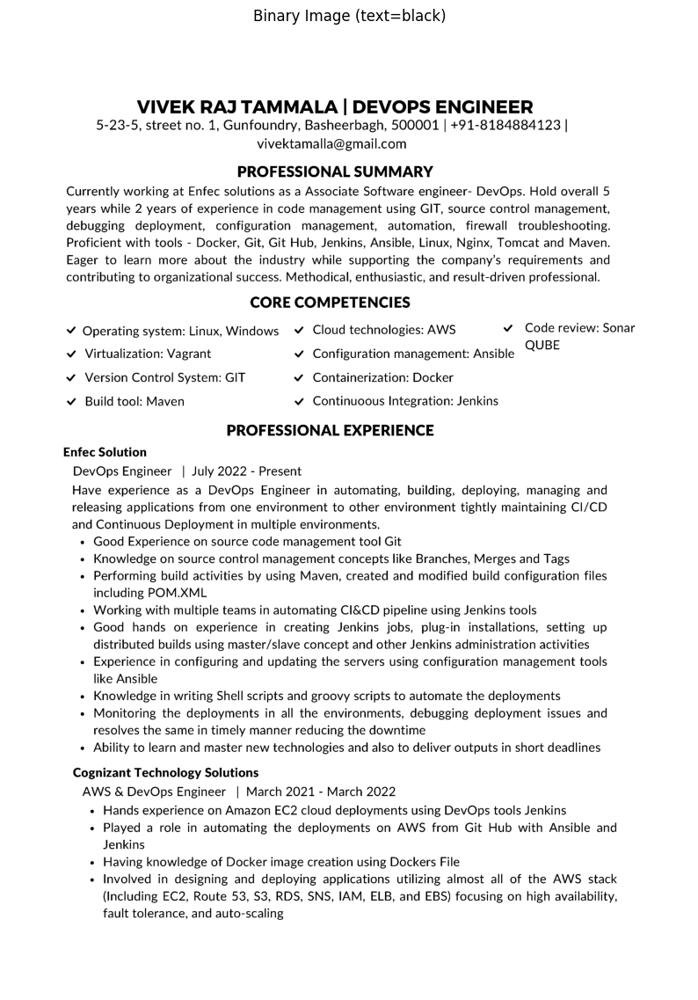

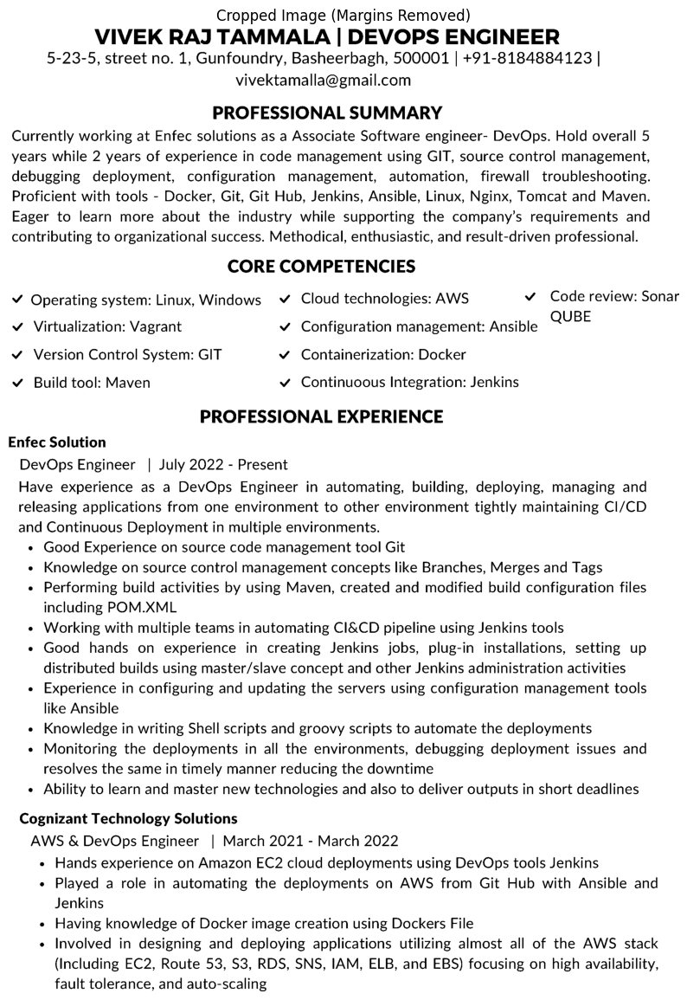

Margins: (259, 3246, 200, 2279)


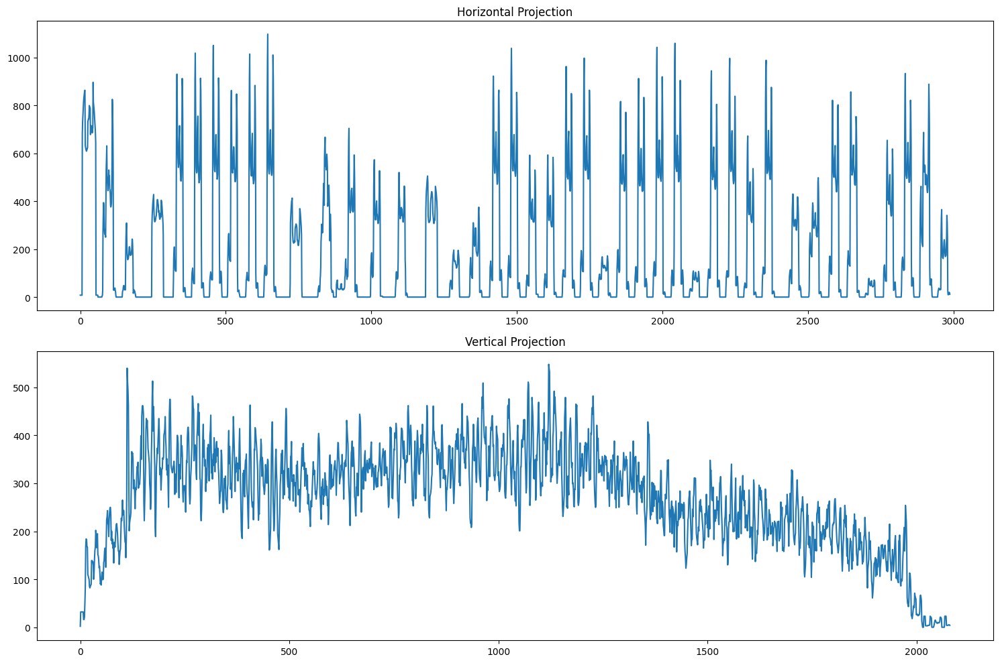

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ---------- UTIL: display ----------
def show(img, title="", figsize=(10,15), cmap='gray'):
    plt.figure(figsize=figsize)
    plt.imshow(img, cmap=cmap)
    plt.title(title)
    plt.axis('off')
    plt.show()

IMG_PATH = processed_paths[0]  # first processed page

# --- Load grayscale image ---
img = cv2.imread(IMG_PATH, cv2.IMREAD_GRAYSCALE)
if img is None:
    raise FileNotFoundError(IMG_PATH)

# --- Binarization (text=0, background=1) ---
_, bin_img = cv2.threshold(img, 0, 1, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# --- Fix white text on black background ---
# Check which has more pixels: 0 or 1
if np.sum(bin_img == 0) > np.sum(bin_img == 1):
    # More black pixels -> likely background=black, text=white -> invert
    bin_img = 1 - bin_img

# Now text=0 (black), background=1 (white)
show(bin_img, "Binary Image (text=black)")


import numpy as np

def detect_and_crop_margins(bin_img, page_number_width=30):
    """
    Detect margins in a binary image (text=0, bg=1).
    Also removes likely page numbers near the bottom (based on pixel density).
    Returns cropped image and crop coordinates (top, bottom, left, right).
    """
    h, w = bin_img.shape

    # --- Horizontal (top & bottom) ---
    top = 0
    for i in range(h):
        if np.any(bin_img[i, :] == 0):
            top = i
            break

    bottom = h - 1
    for i in reversed(range(h)):
        if np.any(bin_img[i, :] == 0):
            bottom = i
            break

    # --- Vertical (left & right) ---
    left = 0
    for j in range(w):
        if np.any(bin_img[:, j] == 0):
            left = j
            break

    right = w - 1
    for j in reversed(range(w)):
        if np.any(bin_img[:, j] == 0):
            right = j
            break

    # --- Optional page number removal ---
    inv_img = 1 - bin_img  # invert: text=1, bg=0
    found_page_number = False
    found_gap = False
    new_bottom = bottom  # keep original bottom unless page number detected

    for i in reversed(range(top, bottom + 1)):
        row_sum = np.sum(inv_img[i, :])
        # print(f"{i}---{row_sum:05d}----{found_page_number}-----{found_gap}")
        # Row too big → not a page number → stop scanning
        if row_sum >= page_number_width:
            break
        # Likely page number: very few text pixels
        elif row_sum > 0 and row_sum < page_number_width:
            found_page_number = True
        # Blank row after page number → gap detected
        elif found_page_number and row_sum == 0:
            found_gap = True
        # Main text resumes → adjust bottom
        if found_page_number and found_gap and row_sum > 0:
            new_bottom = i
            break


    bottom = new_bottom  # only update if page number detected

    # --- Crop the image ---
    cropped_img = bin_img[top:bottom+1, left:right+1]

    return cropped_img, (top, bottom, left, right)


cropped_img , margins = detect_and_crop_margins(bin_img)
show(cropped_img, "Cropped Image (Margins Removed)")
print("Margins:", margins)

# --- Compute horizontal & vertical projections ---
height, width = cropped_img.shape
horizontal = [np.sum(cropped_img[y, :] == 0) for y in range(height)]
vertical   = [np.sum(cropped_img[:, x] == 0) for x in range(width)]

# --- Plot histograms ---
plt.figure(figsize=(15, 10))  # adjust height for clarity
plt.subplot(2, 1, 1)
plt.plot(horizontal)
plt.title("Horizontal Projection")

plt.subplot(2, 1, 2)
plt.plot(vertical)
plt.title("Vertical Projection")

plt.tight_layout()  # prevents overlap
plt.show()


# --- Convert to 1-bit image (0 or 255) ---
bit1_img = (cropped_img * 255).astype(np.uint8)

# # --- Save 1-bit image ---
# cropped_img_path = IMG_PATH.replace(".png", "_1bit.png")
# cv2.imwrite(cropped_img_path, bit1_img)
# print("✅ 1-bit image saved at:", cropped_img_path)


/tmp/ipython-input-3420176432.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


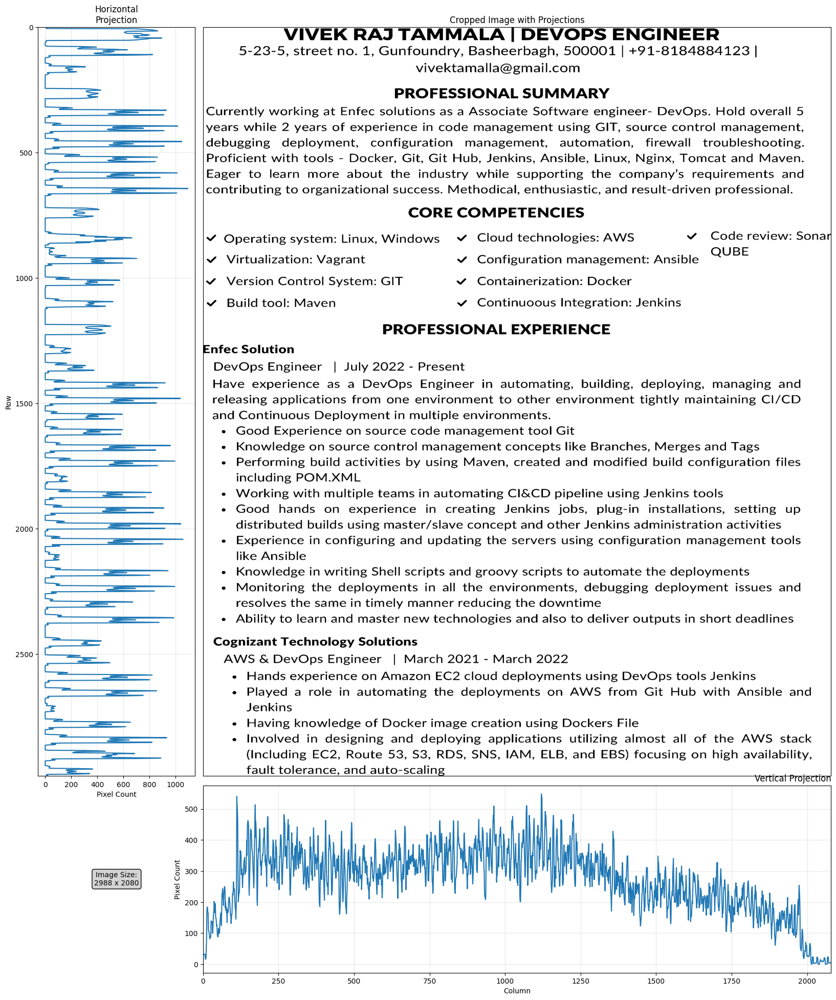

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def show_with_histograms(img, horizontal, vertical, title="Image with Projections"):
    """
    Display image with horizontal projection on the left and vertical projection on the bottom.
    """
    height, width = img.shape

    # Create figure with custom layout
    fig = plt.figure(figsize=(20, 24))

    # Define grid layout: 2x2 with different sizes
    gs = fig.add_gridspec(2, 2,
                         width_ratios=[1, 4],   # left column narrower for horizontal hist
                         height_ratios=[4, 1],  # bottom row shorter for vertical hist
                         hspace=0.02, wspace=0.02)

    # Main image (top-right)
    ax_img = fig.add_subplot(gs[0, 1])
    ax_img.imshow(img, cmap='gray', aspect='auto')
    ax_img.set_title(title)
    ax_img.set_xticks([])
    ax_img.set_yticks([])

    # Horizontal projection (top-left) - rotated 90 degrees
    ax_horizontal = fig.add_subplot(gs[0, 0])
    ax_horizontal.plot(horizontal, range(len(horizontal)))
    ax_horizontal.set_ylim(len(horizontal)-1, 0)  # flip y-axis to match image
    ax_horizontal.set_xlabel('Pixel Count')
    ax_horizontal.set_ylabel('Row')
    ax_horizontal.set_title('Horizontal\nProjection', rotation=0, ha='center')
    ax_horizontal.grid(True, alpha=0.3)

    # Vertical projection (bottom-right)
    ax_vertical = fig.add_subplot(gs[1, 1])
    ax_vertical.plot(range(len(vertical)), vertical)
    ax_vertical.set_xlim(0, len(vertical)-1)
    ax_vertical.set_xlabel('Column')
    ax_vertical.set_ylabel('Pixel Count')
    ax_vertical.set_title('Vertical Projection',loc='right')
    ax_vertical.grid(True, alpha=0.3)

    # Empty subplot (bottom-left) - can be used for additional info
    ax_empty = fig.add_subplot(gs[1, 0])
    ax_empty.axis('off')
    ax_empty.text(0.5, 0.5, f'Image Size:\n{height} x {width}',
                  ha='center', va='center', transform=ax_empty.transAxes,
                  bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray"))

    plt.tight_layout()
    plt.show()

# Use the function with your existing data
show_with_histograms(cropped_img, horizontal, vertical, "Cropped Image with Projections")

In [ ]:
def run_length_encoding(hist, thresh=0):
    """
    Perform run-length encoding on a 1D histogram.
    Returns a list of tuples: (value, length)
    """
    if len(hist) == 0:
        return []

    rle = []
    count = 1
    prev = hist[0]
    start = 0
    for i,val in enumerate(hist):
        if abs(val - prev) <= thresh:
            count += 1
        else:
            rle.append((int(prev), start, count))
            prev = val
            start = i
            count = 1
    rle.append((int(prev), start, count))  # append last run
    return rle


# For vertical histogram
vert_rle = run_length_encoding(vertical)
print("Vertical RLE:", vert_rle[-100:])


# For horizontal histogram
horiz_rle = run_length_encoding(horizontal)
print("Horizontal RLE:", horiz_rle[-100:])


# count histogram peaks
def count_histogram_peaks(rle, thresold=10):
  count = 1
  for v,s,f in rle:
    if v == 0 and f > thresold:
      count += 1
  return count

# count vertical peaks
vertical_peaks = count_histogram_peaks(vert_rle)
print("Vertical peaks:", vertical_peaks)

# count horizontal peaks
horizontal_peaks = count_histogram_peaks(horiz_rle)
print("Horizontal peaks:", horizontal_peaks)

Vertical RLE: [(116, 1944, 1), (127, 1945, 1), (141, 1946, 1), (161, 1947, 1), (182, 1948, 1), (191, 1949, 1), (154, 1950, 1), (102, 1951, 1), (114, 1952, 1), (106, 1953, 1), (99, 1954, 1), (96, 1955, 1), (93, 1956, 1), (180, 1957, 1), (181, 1958, 1), (192, 1959, 1), (172, 1960, 1), (91, 1961, 1), (86, 1962, 1), (100, 1963, 1), (96, 1964, 1), (97, 1965, 1), (120, 1966, 1), (149, 1967, 1), (165, 1968, 1), (194, 1969, 1), (208, 1970, 1), (159, 1971, 1), (197, 1972, 1), (254, 1973, 1), (236, 1974, 1), (220, 1975, 1), (171, 1976, 1), (62, 1977, 1), (50, 1978, 1), (47, 1979, 1), (43, 1980, 1), (53, 1981, 1), (82, 1982, 1), (113, 1983, 1), (111, 1984, 1), (99, 1985, 1), (68, 1986, 1), (24, 1987, 1), (23, 1988, 1), (18, 1989, 1), (25, 1990, 1), (32, 1991, 1), (43, 1992, 1), (45, 1993, 1), (41, 1994, 1), (71, 1995, 1), (65, 1996, 1), (61, 1997, 1), (59, 1998, 1), (26, 1999, 1), (27, 2000, 2), (25, 2002, 1), (24, 2003, 1), (26, 2004, 1), (25, 2005, 1), (26, 2006, 1), (32, 2007, 1), (62, 2008, 1

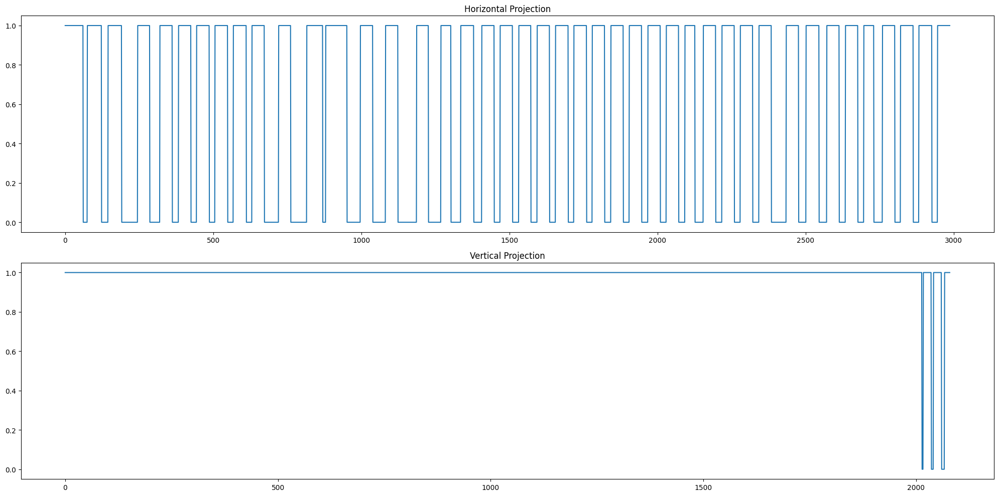

Vertical RLE: [(1, 0, 2015), (0, 2014, 3), (1, 2017, 19), (0, 2036, 5), (1, 2041, 19), (0, 2060, 7), (1, 2067, 13)]
Horizontal RLE: [(1, 0, 62), (0, 61, 14), (1, 75, 48), (0, 123, 22), (1, 145, 46), (0, 191, 54), (1, 245, 41), (0, 286, 34), (1, 320, 42), (0, 362, 21), (1, 383, 42), (0, 425, 19), (1, 444, 43), (0, 487, 19), (1, 506, 43), (0, 549, 19), (1, 568, 44), (0, 612, 19), (1, 631, 42), (0, 673, 48), (1, 721, 41), (0, 762, 54), (1, 816, 54), (0, 870, 10), (1, 880, 72), (0, 952, 45), (1, 997, 42), (0, 1039, 43), (1, 1082, 42), (0, 1124, 63), (1, 1187, 40), (0, 1227, 42), (1, 1269, 34), (0, 1303, 33), (1, 1336, 44), (0, 1380, 27), (1, 1407, 42), (0, 1449, 20), (1, 1469, 42), (0, 1511, 21), (1, 1532, 41), (0, 1573, 21), (1, 1594, 42), (0, 1636, 20), (1, 1656, 43), (0, 1699, 19), (1, 1718, 43), (0, 1761, 19), (1, 1780, 42), (0, 1822, 21), (1, 1843, 42), (0, 1885, 20), (1, 1905, 42), (0, 1947, 21), (1, 1968, 42), (0, 2010, 20), (1, 2030, 42), (0, 2072, 21), (1, 2093, 34), (0, 2127, 28)

In [ ]:
# binary histograms
def make_binary_histogram(hist,thresh=0):
  for i in range(len(hist)):
    hist[i] = 1 if hist[i] > thresh else 0

  return hist

bin_horiz = make_binary_histogram(list(horizontal))
bin_vert = make_binary_histogram(list(vertical))


# --- Plot histograms ---
plt.figure(figsize=(20, 10))  # adjust height for clarity
plt.subplot(2, 1, 1)
plt.plot(bin_horiz)
plt.title("Horizontal Projection")

plt.subplot(2, 1, 2)
plt.plot(bin_vert)
plt.title("Vertical Projection")

plt.tight_layout()  # prevents overlap
plt.show()


# For vertical histogram
vert_rle = run_length_encoding(bin_vert)
print("Vertical RLE:", vert_rle)


# For horizontal histogram
horiz_rle = run_length_encoding(bin_horiz)
print("Horizontal RLE:", horiz_rle)

# count vertical peaks
vertical_peaks = count_histogram_peaks(vert_rle)
print("Vertical peaks:", vertical_peaks)

# count horizontal peaks
horizontal_peaks = count_histogram_peaks(horiz_rle)
print("Horizontal peaks:", horizontal_peaks)


Counter({61: 1, 123: 1, 191: 1, 286: 1, 362: 1, 425: 1, 487: 1, 549: 1, 612: 1, 673: 1, 762: 1, 870: 1, 952: 1, 1039: 1, 1124: 1, 1227: 1, 1303: 1, 1380: 1, 1449: 1, 1511: 1, 1573: 1, 1636: 1, 1699: 1, 1761: 1, 1822: 1, 1885: 1, 1947: 1, 2010: 1, 2072: 1, 2127: 1, 2197: 1, 2260: 1, 2322: 1, 2385: 1, 2477: 1, 2546: 1, 2614: 1, 2677: 1, 2731: 1, 2802: 1, 2864: 1, 2927: 1})
Counter({0: 1, 75: 1, 145: 1, 245: 1, 320: 1, 383: 1, 444: 1, 506: 1, 568: 1, 631: 1, 721: 1, 816: 1, 880: 1, 997: 1, 1082: 1, 1187: 1, 1269: 1, 1336: 1, 1407: 1, 1469: 1, 1532: 1, 1594: 1, 1656: 1, 1718: 1, 1780: 1, 1843: 1, 1905: 1, 1968: 1, 2030: 1, 2093: 1, 2155: 1, 2218: 1, 2280: 1, 2343: 1, 2435: 1, 2502: 1, 2572: 1, 2635: 1, 2697: 1, 2760: 1, 2821: 1, 2883: 1, 2946: 1})
Counter({2014: 1, 2036: 1, 2060: 1})
Counter({0: 1, 2017: 1, 2041: 1, 2067: 1})


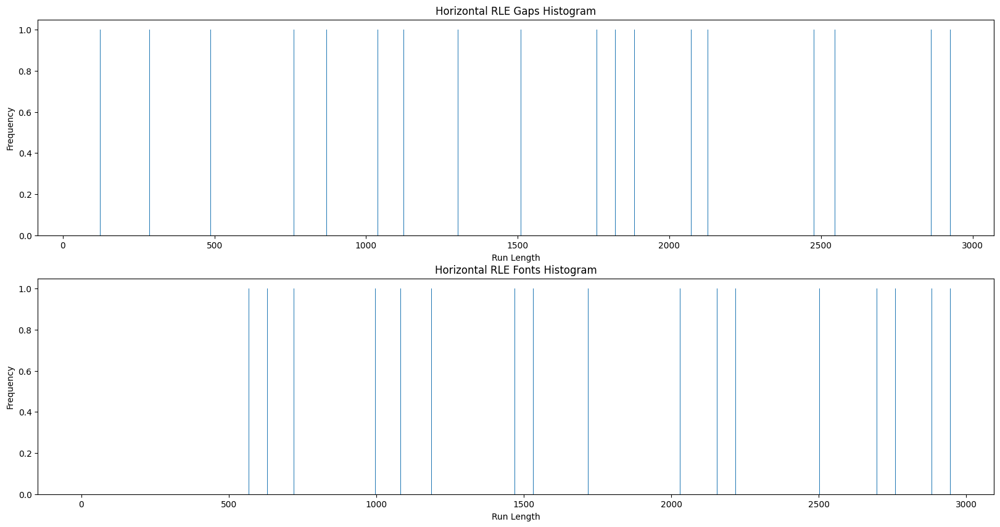

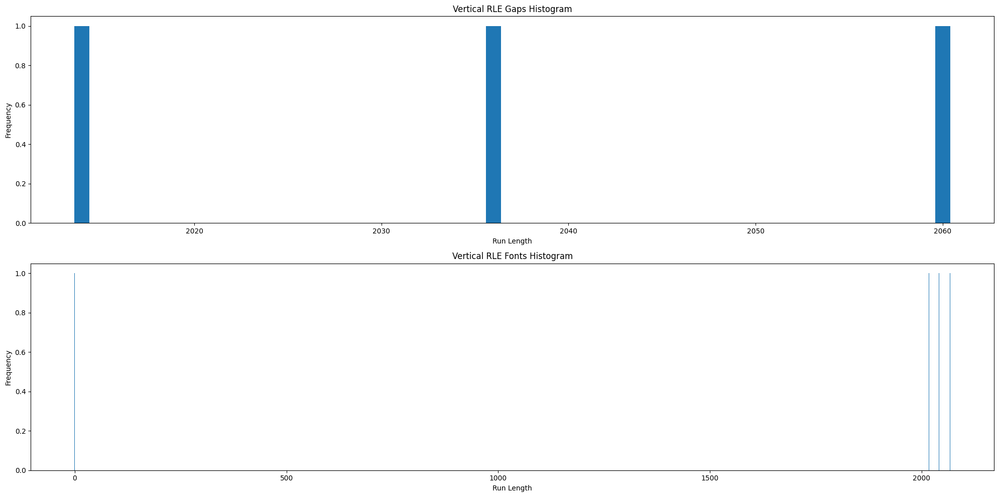

In [ ]:
# extract information like heading size or text size from the rle (histigrams)
# plot the histogramm
from collections import Counter
def hist_map(rle):
  return Counter([x[1] for x in rle if x[0]==0]) , Counter([x[1] for x in rle if x[0]==1])

# # For vertical histogram
# vert_rle = run_length_encoding(vertical)
# print("Vertical RLE:", vert_rle[-100:])


# # For horizontal histogram
# horiz_rle = run_length_encoding(horizontal)
# print("Horizontal RLE:", horiz_rle[-100:])

gaps_map, fonts_map = hist_map(horiz_rle)

print(gaps_map)
print(fonts_map)

# Plot the histograms
plt.figure(figsize=(20, 10))

plt.subplot(2, 1, 1)
plt.bar(gaps_map.keys(), gaps_map.values())
plt.title("Horizontal RLE Gaps Histogram")
plt.xlabel("Run Length")
plt.ylabel("Frequency")

plt.subplot(2, 1, 2)
plt.bar(fonts_map.keys(), fonts_map.values())
plt.title("Horizontal RLE Fonts Histogram")
plt.xlabel("Run Length")
plt.ylabel("Frequency")

gaps_map, fonts_map = hist_map(vert_rle)

print(gaps_map)
print(fonts_map)

# Plot the histograms
plt.figure(figsize=(20, 10))

plt.subplot(2, 1, 1)
plt.bar(gaps_map.keys(), gaps_map.values())
plt.title("Vertical RLE Gaps Histogram")
plt.xlabel("Run Length")
plt.ylabel("Frequency")

plt.subplot(2, 1, 2)
plt.bar(fonts_map.keys(), fonts_map.values())
plt.title("Vertical RLE Fonts Histogram")
plt.xlabel("Run Length")
plt.ylabel("Frequency")



plt.tight_layout()
plt.show()



Processing node 1 (depth=2) → cropped [0:2987, 0:2079] shape=(2988, 2080)


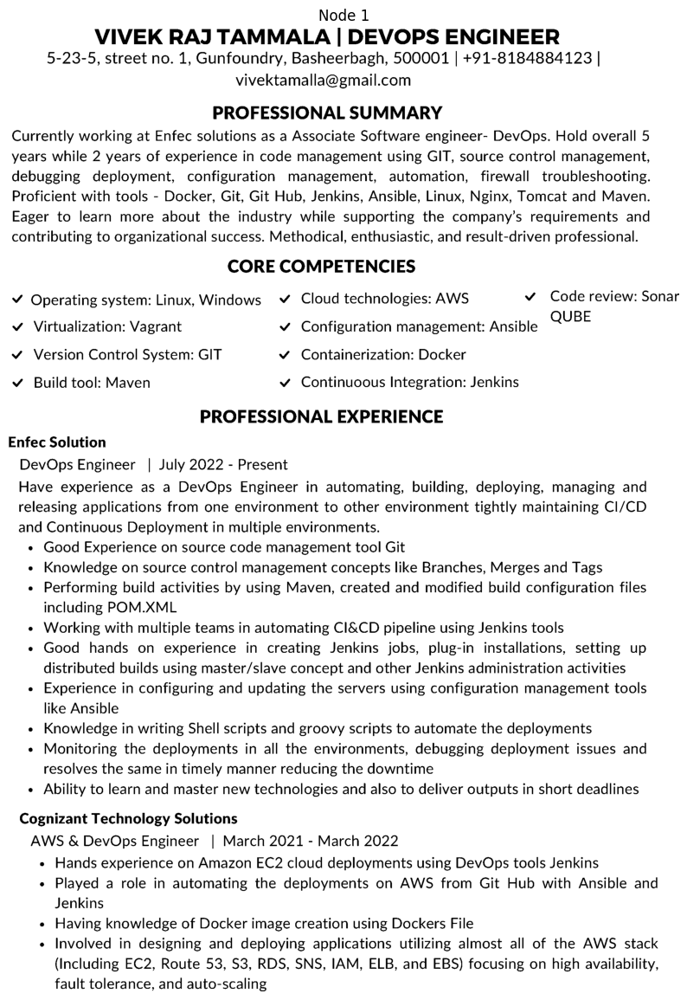

↳ Splitting horizontally into 42 sections...
│   ├── Processing node 1-1 (depth=1) → cropped [0:1123, 10:2079] shape=(1124, 2070)


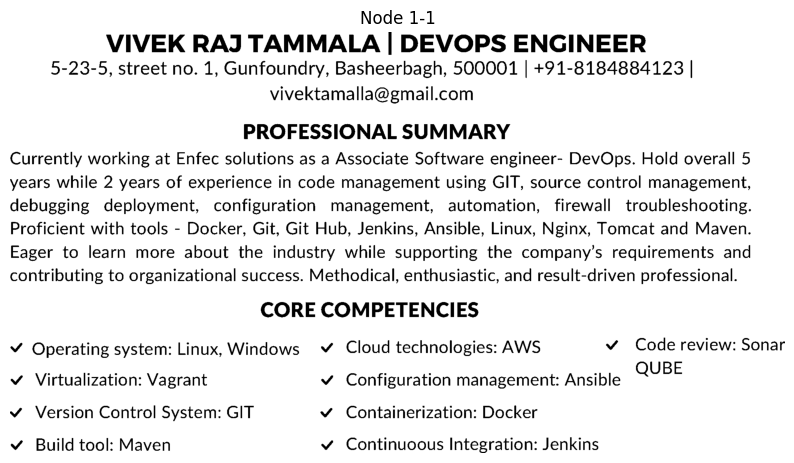

│   ├── ↳ Splitting horizontally into 14 sections...
│   │   ├── Processing node 1-1-1 (depth=0) → cropped [0:190, 110:1821] shape=(191, 1712)


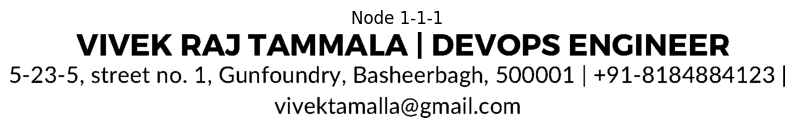

│   │   ├── Reached max depth or empty image — stopping recursion.
│   │   ├── Processing node 1-1-2 (depth=0) → cropped [27:543, 0:1978] shape=(517, 1979)


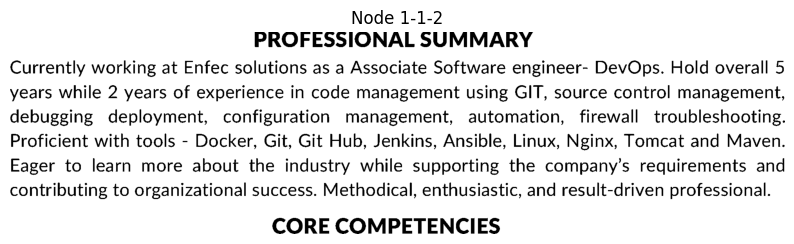

│   │   ├── Reached max depth or empty image — stopping recursion.
│   │   ├── Processing node 1-1-3 (depth=0) → cropped [27:334, 0:2069] shape=(308, 2070)


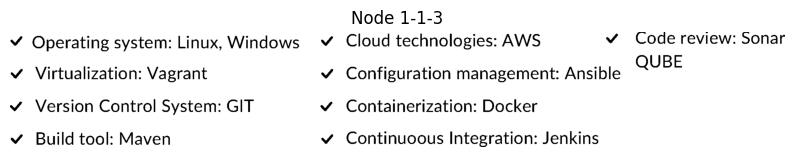

│   │   ├── Reached max depth or empty image — stopping recursion.
│   ├── Processing node 1-2 (depth=1) → cropped [32:1832, 0:2013] shape=(1801, 2014)


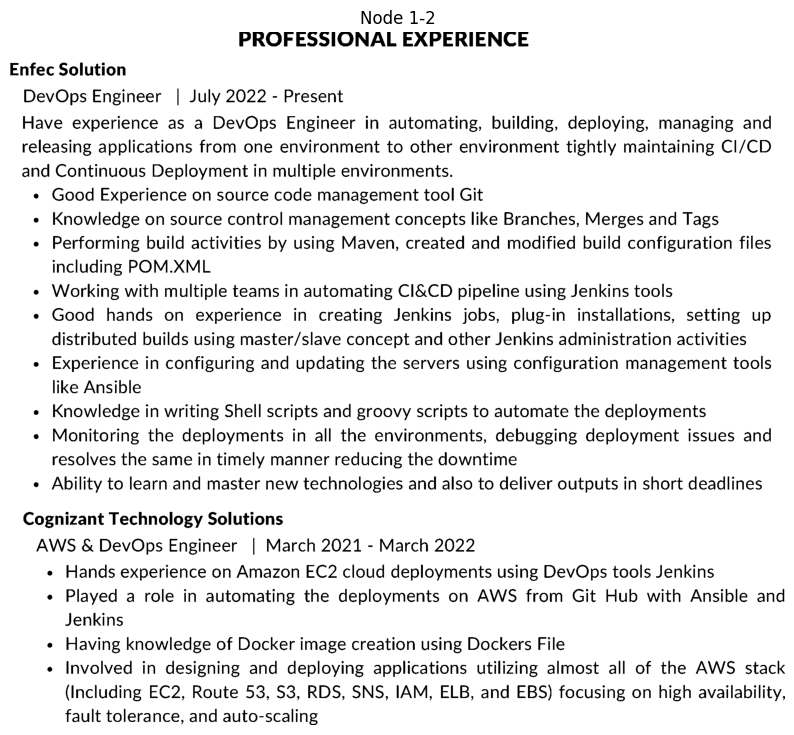

│   ├── ↳ Splitting horizontally into 28 sections...
│   │   ├── Processing node 1-2-1 (depth=0) → cropped [0:1197, 0:1977] shape=(1198, 1978)


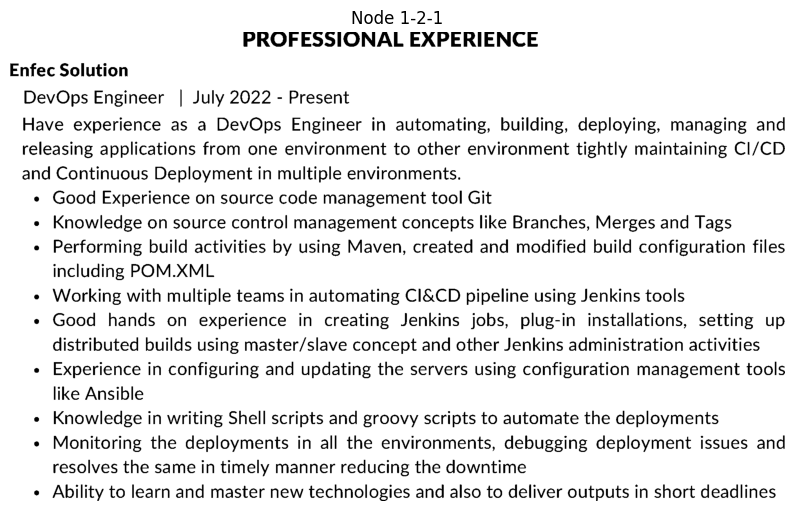

│   │   ├── Reached max depth or empty image — stopping recursion.
│   │   ├── Processing node 1-2-2 (depth=0) → cropped [25:577, 35:2013] shape=(553, 1979)


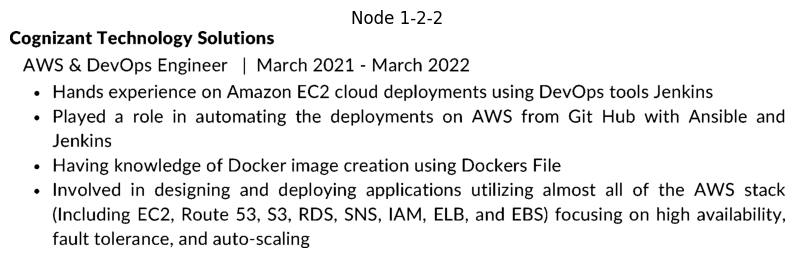

│   │   ├── Reached max depth or empty image — stopping recursion.


In [ ]:
def get_splits(rle, peaks):
    """
    Selects split positions based on run-length encoding (RLE) gaps.

    Args:
        rle (list of tuples): Each tuple = (value, start, length), e.g. (0, start_idx, gap_length)
        peaks (int): Number of peaks/gaps to select.

    Returns:
        list: Split positions (x-coordinates or indices).
    """
    splits = []
    # Sort gaps (value == 0) by their length descending
    sorted_rle = sorted(rle, key=lambda x: x[2] if x[0] == 0 else 0, reverse=True)

    if not sorted_rle:
        return splits

    if peaks == 2:
        # Only one split → largest gap
        max_gap = sorted_rle[0]
        splits.append(max_gap)
    else:
        # Multiple peaks → include all gaps within a threshold (10) of max length
        max_len = sorted_rle[0][2]
        threshold = 5
        for val, start, length in sorted_rle:
            if val == 0 and (max_len - length) <= threshold:
                splits.append((val,start,length))

    return splits


def recursive_split(img, depth=2, title="1", level=0):
    """
    Recursively splits an image into sections using histogram analysis
    and run-length encoding (RLE) for segmentation.
    Corrects cropping issues.
    """
    indent = "│   " * level + ("├── " if level > 0 else "")

    # Step 1: Detect and crop margins
    cropped_img, margins = detect_and_crop_margins(img)
    top, bottom, left, right = margins

    print(f"{indent}Processing node {title} (depth={depth}) "
          f"→ cropped [{top}:{bottom}, {left}:{right}] "
          f"shape={cropped_img.shape}")
    show(cropped_img, f"Node {title}")

    if depth == 0 or cropped_img.size == 0:
        print(f"{indent}Reached max depth or empty image — stopping recursion.")
        return

    # Step 2: Compute axial histograms on cropped image
    height, width = cropped_img.shape
    horizontal = [np.sum(cropped_img[y, :] == 0) for y in range(height)]
    vertical   = [np.sum(cropped_img[:, x] == 0) for x in range(width)]

    h_rle = run_length_encoding(horizontal)
    v_rle = run_length_encoding(vertical)

    h_peaks = count_histogram_peaks(h_rle)
    v_peaks = count_histogram_peaks(v_rle)

    # Step 3: Split vertically (columns)
    if v_peaks > 1:
        print(f"{indent}↳ Splitting vertically into {v_peaks} segments...")
        splits = get_splits(v_rle, v_peaks)
        splits = sorted(splits, key=lambda x: x[1])

        prev_x = 0
        for i, (_, start, length) in enumerate(splits):
            cut = start + length // 2
            # crop relative to cropped_img
            new_img = cropped_img[:, prev_x:cut]
            recursive_split(new_img, depth=depth - 1,
                            title=f"{title}-{i+1}", level=level + 1)
            prev_x = cut
        # remaining right part
        new_img = cropped_img[:, prev_x:]
        recursive_split(new_img, depth=depth - 1,
                        title=f"{title}-{len(splits)+1}", level=level + 1)
        return

    # Step 4: Split horizontally (rows)
    elif h_peaks > 1:
        print(f"{indent}↳ Splitting horizontally into {h_peaks} sections...")
        splits = get_splits(h_rle, h_peaks)
        splits = sorted(splits, key=lambda x: x[1])

        prev_y = 0
        for i, (_, start, length) in enumerate(splits):
            cut = start + length // 2
            new_img = cropped_img[prev_y:cut, :]
            recursive_split(new_img, depth=depth - 1,
                            title=f"{title}-{i+1}", level=level + 1)
            prev_y = cut
        # remaining bottom part
        new_img = cropped_img[prev_y:, :]
        recursive_split(new_img, depth=depth - 1,
                        title=f"{title}-{len(splits)+1}", level=level + 1)
        return

    # Step 5: Leaf node
    else:
        print(f"{indent}⚬ No further splits detected — possibly table, image, or noise region.")
        return


recursive_split(cropped_img)

# Section Segmentation


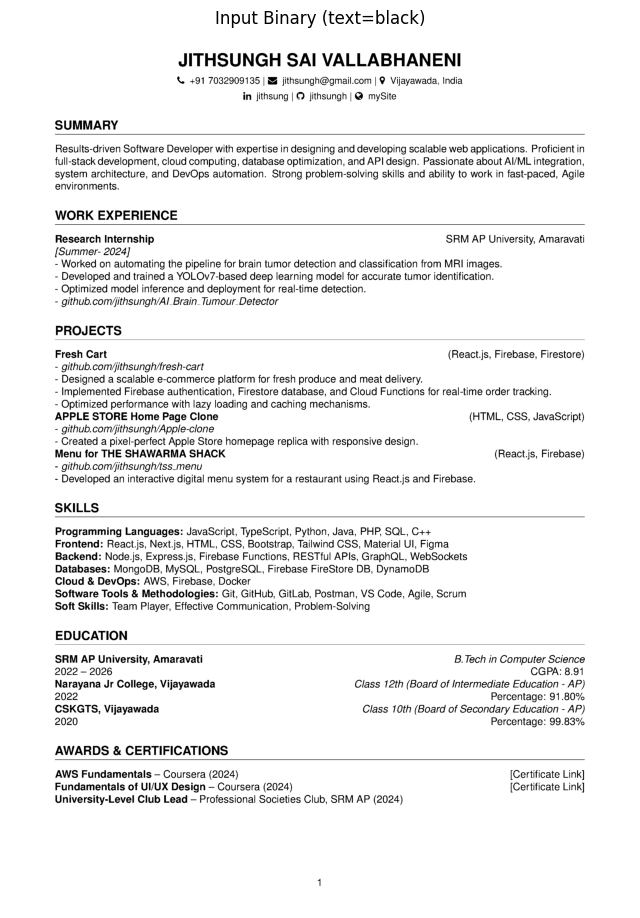

Found 2420 components (filtered min_area=5)


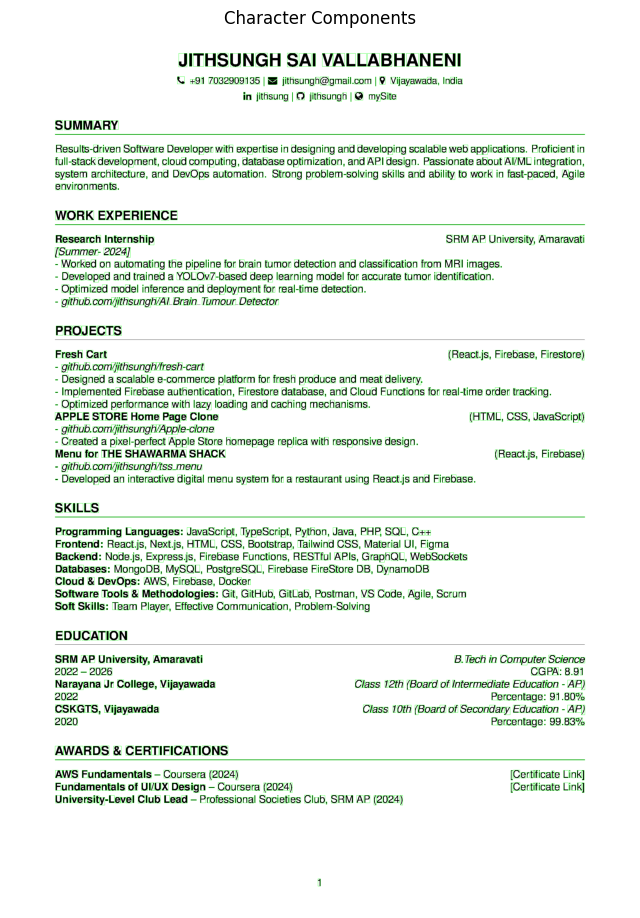

Initial vertical clustering -> 51 candidate lines (line_delta=16)
Dynamic word_gap_thresh = 4 (median of 2138 gaps)
Grouped into 895 words


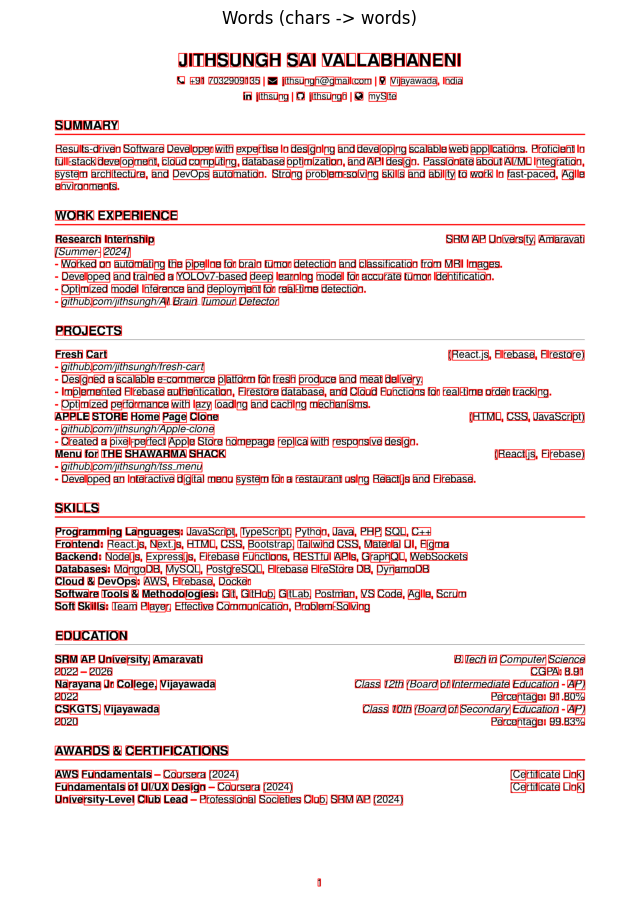

Collapsed words into 51 lines


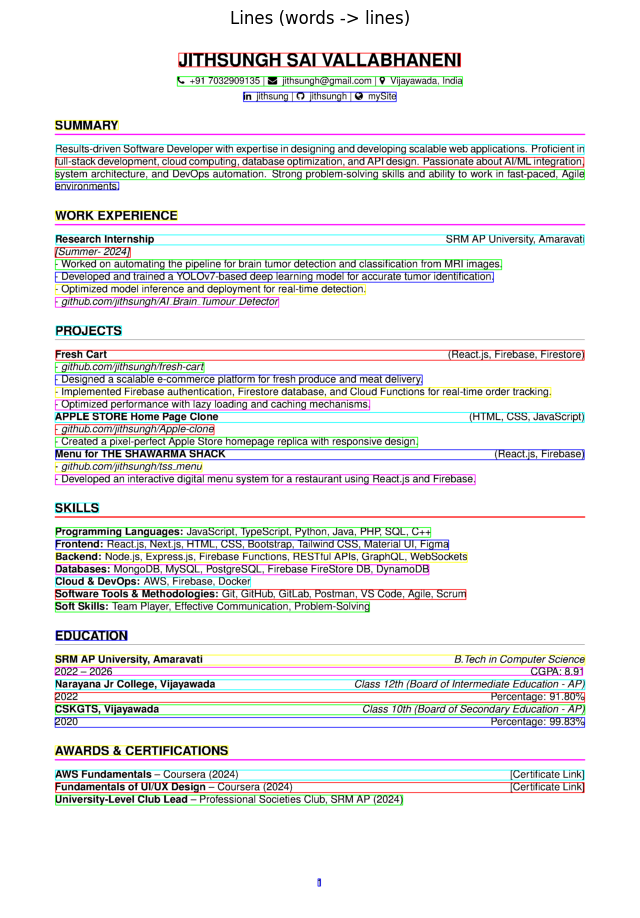

median_line_gap=11, para_gap_thresh=22
Grouped into 16 paragraphs


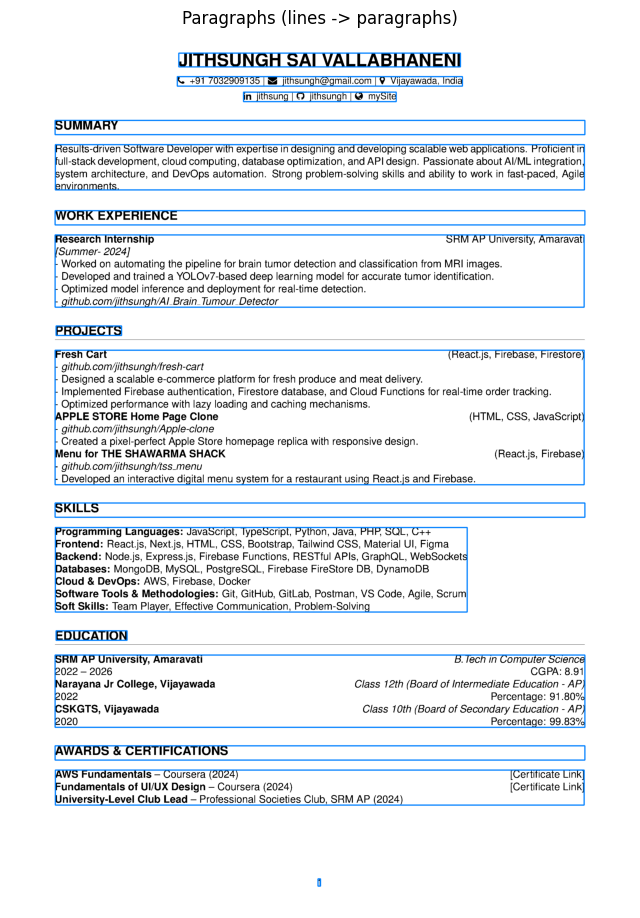

Formed 1 blocks


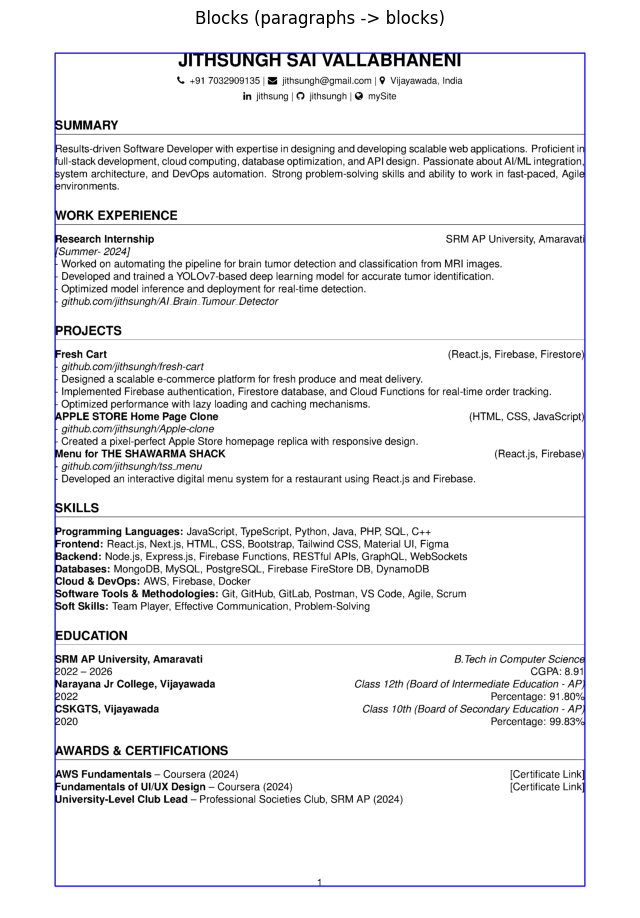

Saved debug images and boxes.json to /content/dla_debug


In [ ]:

# ---------- CONFIG ----------
IMG_PATH = processed_paths[0]  # change as needed
OUT_DIR = "/content/dla_debug"
os.makedirs(OUT_DIR, exist_ok=True)

# ---------- UTIL: display ----------
def show(img, title="", figsize=(8,12), cmap='gray'):
    plt.figure(figsize=figsize); plt.imshow(img, cmap=cmap); plt.title(title); plt.axis('off')
    plt.show()

# ---------- Load binary image (ensure text=0, bg=255) ----------
img = cv2.imread(IMG_PATH, cv2.IMREAD_GRAYSCALE)
if img is None:
    raise FileNotFoundError(IMG_PATH)
# ensure binary
_, bin_img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# if text is white on black, invert to have text=0
if np.sum(bin_img==0) < np.sum(bin_img==255):
    # more white pixels than black -> likely background=white, text=black (good)
    pass
else:
    # invert if needed
    bin_img = 255 - bin_img

show(bin_img, "Input Binary (text=black)")

# ---------- Step 1: connected components -> character blobs ----------
# Use small component filtering to remove speckle
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(255-bin_img, connectivity=8)
# connectedComponentsWithStats works on foreground=non-zero; so feed 255-bin_img (text=255)

min_area = 5    # tune: remove tiny specks
components = []
for i in range(1, num_labels):
    x, y, w, h, area = stats[i]
    if area >= min_area and w>1 and h>1:
        components.append({'id': i, 'x': x, 'y': y, 'w': w, 'h': h, 'area': area,
                           'cx': int(centroids[i][0]), 'cy': int(centroids[i][1])})

print(f"Found {len(components)} components (filtered min_area={min_area})")

# visualize character boxes
vis = cv2.cvtColor(bin_img.copy(), cv2.COLOR_GRAY2BGR)
for c in components:
    cv2.rectangle(vis, (c['x'], c['y']), (c['x']+c['w'], c['y']+c['h']), (0,255,0), 1)
show(vis, "Character Components")

# ---------- Step 2: compute dynamic horizontal gap (for word grouping) ----------
# Group components by approximate line using cy (vertical clustering)
# First sort components by cy
components = sorted(components, key=lambda c: (c['cy'], c['cx']))

# Simple line clustering: two components on same line if vertical centers within delta_y
cy_list = [c['cy'] for c in components]
if len(cy_list) > 1:
    median_char_height = int(np.median([c['h'] for c in components]))
else:
    median_char_height = 10

line_delta = max( int(median_char_height * 0.7), 5 )  # dynamic tolerance
lines = []
current_line = [components[0]]
for c in components[1:]:
    if abs(c['cy'] - current_line[-1]['cy']) <= line_delta:
        current_line.append(c)
    else:
        lines.append(current_line)
        current_line = [c]
lines.append(current_line)
print(f"Initial vertical clustering -> {len(lines)} candidate lines (line_delta={line_delta})")

# compute horizontal gaps across all lines
all_gaps = []
for line in lines:
    # sort by x
    line_sorted = sorted(line, key=lambda c: c['x'])
    for a,b in zip(line_sorted, line_sorted[1:]):
        gap = b['x'] - (a['x'] + a['w'])
        if gap >= 0:
            all_gaps.append(gap)
if len(all_gaps) == 0:
    word_gap_thresh = median_char_height * 1.5
else:
    word_gap_thresh = int(np.median(all_gaps) * 1.2)  # tweak factor 1.2 to be slightly lenient

print(f"Dynamic word_gap_thresh = {word_gap_thresh} (median of {len(all_gaps)} gaps)")

# ---------- Step 3: group characters -> words using horizontal gap threshold ----------
words = []
for line in lines:
    line_sorted = sorted(line, key=lambda c: c['x'])
    current_word = {'x1': line_sorted[0]['x'], 'y1': line_sorted[0]['y'],
                    'x2': line_sorted[0]['x']+line_sorted[0]['w'],
                    'y2': line_sorted[0]['y']+line_sorted[0]['h']}
    for a,b in zip(line_sorted, line_sorted[1:]):
        gap = b['x'] - (a['x'] + a['w'])
        if gap <= word_gap_thresh:
            # merge into current word
            current_word['x2'] = max(current_word['x2'], b['x']+b['w'])
            current_word['y1'] = min(current_word['y1'], b['y'])
            current_word['y2'] = max(current_word['y2'], b['y']+b['h'])
        else:
            words.append(current_word)
            current_word = {'x1': b['x'], 'y1': b['y'], 'x2': b['x']+b['w'], 'y2': b['y']+b['h']}
    words.append(current_word)

print(f"Grouped into {len(words)} words")

# visualize words
vis = cv2.cvtColor(bin_img.copy(), cv2.COLOR_GRAY2BGR)
for w in words:
    cv2.rectangle(vis, (w['x1'], w['y1']), (w['x2'], w['y2']), (255,0,0), 2)
show(vis, "Words (chars -> words)")

# ---------- Step 4: group words -> lines (tight grouping by y overlap) ----------
# For word-level line grouping, use y-centers and vertical overlap
word_objs = []
for w in words:
    word_objs.append({'x1': w['x1'], 'y1': w['y1'], 'x2': w['x2'], 'y2': w['y2'],
                      'cx': (w['x1']+w['x2'])//2, 'cy': (w['y1']+w['y2'])//2,
                      'h': w['y2']-w['y1']})

word_objs = sorted(word_objs, key=lambda x: (x['cy'], x['x1']))

# cluster into lines by cy distance
line_clusters = []
current = [word_objs[0]]
for w in word_objs[1:]:
    if abs(w['cy'] - current[-1]['cy']) <= max( int(np.median([x['h'] for x in current])*0.6), 6):
        current.append(w)
    else:
        line_clusters.append(current)
        current = [w]
line_clusters.append(current)

print(f"Collapsed words into {len(line_clusters)} lines")

# visualize lines (each line a different color)
vis = cv2.cvtColor(bin_img.copy(), cv2.COLOR_GRAY2BGR)
colors = [(255,0,0),(0,255,0),(0,0,255),(255,255,0),(255,0,255),(0,255,255)]
for i,ln in enumerate(line_clusters):
    col = colors[i % len(colors)]
    xs = [w['x1'] for w in ln]; ys = [w['y1'] for w in ln]; x2s = [w['x2'] for w in ln]; y2s=[w['y2'] for w in ln]
    x1, y1, x2, y2 = min(xs), min(ys), max(x2s), max(y2s)
    cv2.rectangle(vis, (x1,y1),(x2,y2), col, 2)
show(vis, "Lines (words -> lines)")

# ---------- Step 5: compute line gaps -> dynamic paragraph threshold ----------
# compute vertical gaps between successive line bounding boxes
line_boxes = []
for ln in line_clusters:
    xs = [w['x1'] for w in ln]; ys = [w['y1'] for w in ln]; x2s = [w['x2'] for w in ln]; y2s=[w['y2'] for w in ln]
    line_boxes.append({'x1':min(xs),'y1':min(ys),'x2':max(x2s),'y2':max(y2s),'h':max(y2s)-min(ys)})

line_boxes = sorted(line_boxes, key=lambda b:b['y1'])
line_gaps = []
for a,b in zip(line_boxes, line_boxes[1:]):
    gap = b['y1'] - a['y2']
    line_gaps.append(gap if gap>0 else 0)

if len(line_gaps)>0:
    median_line_gap = int(np.median([g for g in line_gaps if g>0]) if np.any(np.array(line_gaps)>0) else np.median(line_gaps))
else:
    median_line_gap = 10

# paragraph threshold: if gap > k * median_line_gap => new paragraph
para_k = 2.0
para_gap_thresh = max(int(median_line_gap * para_k), median_line_gap+4)
print(f"median_line_gap={median_line_gap}, para_gap_thresh={para_gap_thresh}")

# ---------- Step 6: group lines -> paragraphs ----------
paragraphs = []
current_para = [line_boxes[0]]
for a,b in zip(line_boxes, line_boxes[1:]):
    gap = b['y1'] - a['y2']
    if gap <= para_gap_thresh:
        current_para.append(b)
    else:
        paragraphs.append(current_para)
        current_para = [b]
paragraphs.append(current_para)
print(f"Grouped into {len(paragraphs)} paragraphs")

# visualize paragraphs
vis = cv2.cvtColor(bin_img.copy(), cv2.COLOR_GRAY2BGR)
for i,para in enumerate(paragraphs):
    xs = [l['x1'] for l in para]; ys = [l['y1'] for l in para]; x2s = [l['x2'] for l in para]; y2s=[l['y2'] for l in para]
    x1,y1,x2,y2 = min(xs), min(ys), max(x2s), max(y2s)
    cv2.rectangle(vis, (x1,y1),(x2,y2), (0,128,255), 3)
show(vis, "Paragraphs (lines -> paragraphs)")

# ---------- Step 7: group paragraphs -> blocks (cluster nearby paras horizontally/vertical) ----------
# measure inter-paragraph horizontal and vertical distances and cluster paragraphs into blocks
para_boxes = []
for para in paragraphs:
    xs = [l['x1'] for l in para]; ys = [l['y1'] for l in para]; x2s = [l['x2'] for l in para]; y2s=[l['y2'] for l in para]
    para_boxes.append({'x1':min(xs),'y1':min(ys),'x2':max(x2s),'y2':max(y2s)})

# simple agglomerative merge: if two paras overlap in x or are near horizontally, merge
blocks = []
used = [False]*len(para_boxes)
for i,a in enumerate(para_boxes):
    if used[i]:
        continue
    bx = a.copy()
    used[i] = True
    merged = True
    while merged:
        merged = False
        for j,b in enumerate(para_boxes):
            if used[j]:
                continue
            # horizontal overlap or proximity?
            horiz_overlap = (min(bx['x2'], b['x2']) - max(bx['x1'], b['x1'])) > - int(median_char_height*0.5)
            vert_proximity = abs(b['y1'] - bx['y2']) < para_gap_thresh*1.2 or abs(bx['y1'] - b['y2']) < para_gap_thresh*1.2
            if horiz_overlap or vert_proximity:
                # merge
                bx['x1'] = min(bx['x1'], b['x1']); bx['y1'] = min(bx['y1'], b['y1'])
                bx['x2'] = max(bx['x2'], b['x2']); bx['y2'] = max(bx['y2'], b['y2'])
                used[j] = True
                merged = True
    blocks.append(bx)

print(f"Formed {len(blocks)} blocks")

# visualize blocks
vis = cv2.cvtColor(bin_img.copy(), cv2.COLOR_GRAY2BGR)
for b in blocks:
    cv2.rectangle(vis, (b['x1'],b['y1']), (b['x2'],b['y2']), (0,0,255), 3)
show(vis, "Blocks (paragraphs -> blocks)")



# ---------- Save outputs ----------
import json
out = {
    'components': components,
    'words': words,
    'lines': [{'x1':l['x1'],'y1':l['y1'],'x2':l['x2'],'y2':l['y2']} for l in line_boxes],
    'paragraphs': [{'x1':min([l['x1'] for l in p]), 'y1':min([l['y1'] for l in p]),
                    'x2':max([l['x2'] for l in p]), 'y2':max([l['y2'] for l in p])} for p in paragraphs],
    'blocks': blocks
}
def np_encoder(obj):
    if isinstance(obj, (np.integer, np.int32, np.int64)):
        return int(obj)
    elif isinstance(obj, (np.floating, np.float32, np.float64)):
        return float(obj)
    elif isinstance(obj, np.ndarray):
        return obj.tolist()
    else:
        raise TypeError(f"Object of type {type(obj)} is not JSON serializable")

with open(os.path.join(OUT_DIR, "boxes.json"), "w") as f:
    json.dump(out, f, indent=2, default=np_encoder)

print("Saved debug images and boxes.json to", OUT_DIR)

In [ ]:
import cv2
import numpy as np
from scipy.ndimage import gaussian_filter1d  # pip install scipy

try:
    import pytesseract
    OCR_AVAILABLE = True
except Exception:
    OCR_AVAILABLE = False


# --- Helpers ---

def load_and_preprocess(path, invert=True, deskew=True, scale_w=1000):
    """Load image, resize, binarize, and optionally invert and deskew."""
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError("Could not read image: " + path)

    # Resize to fixed width for more stable parameters
    h, w = img.shape
    scale = scale_w / float(w)
    img = cv2.resize(img, (scale_w, int(h * scale)), interpolation=cv2.INTER_AREA)

    # Binarize
    _, bw = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    if invert:
        bw = 255 - bw  # text = 255

    # Optional deskew (commented for now)
    # if deskew:
    #     coords = np.column_stack(np.where(bw > 0))
    #     if coords.shape[0] > 0:
    #         angle = cv2.minAreaRect(coords)[-1]
    #         if angle < -45:
    #             angle = -(90 + angle)
    #         else:
    #             angle = -angle
    #         M = cv2.getRotationMatrix2D((bw.shape[1] / 2, bw.shape[0] / 2), angle, 1.0)
    #         bw = cv2.warpAffine(bw, M, (bw.shape[1], bw.shape[0]),
    #                             flags=cv2.INTER_LINEAR, borderValue=0)
    return bw


def remove_lines(bw, horiz_thresh=0.5, vert_thresh=0.5):
    """Remove long horizontal and vertical lines that distort projections."""
    h, w = bw.shape
    out = bw.copy()

    # Horizontal
    horiz_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (int(w * horiz_thresh), 1))
    detected = cv2.morphologyEx(out, cv2.MORPH_OPEN, horiz_kernel)
    out = cv2.subtract(out, detected)

    # Vertical
    vert_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, max(3, int(h * vert_thresh))))
    detected = cv2.morphologyEx(out, cv2.MORPH_OPEN, vert_kernel)
    out = cv2.subtract(out, detected)

    return out


def projections(bw):
    """Compute horizontal and vertical projections (sum of text pixels)."""
    hproj = bw.sum(axis=1) / 255
    vproj = bw.sum(axis=0) / 255
    return hproj, vproj


def smooth(arr, sigma=2):
    """Gaussian smoothing for histograms."""
    return gaussian_filter1d(arr.astype(float), sigma=sigma)


def find_text_bands(hproj_smoothed, min_height=3, thresh_ratio=0.05):
    """Find bands of text rows based on horizontal projection profile."""
    h = len(hproj_smoothed)
    thresh = np.max(hproj_smoothed) * thresh_ratio
    mask = hproj_smoothed > thresh
    bands = []
    i = 0
    while i < h:
        if mask[i]:
            start = i
            while i < h and mask[i]:
                i += 1
            end = i - 1
            if (end - start + 1) >= min_height:
                bands.append((start, end))
        i += 1
    return bands


def bbox_from_band(bw, band):
    """Compute bounding box of a text band."""
    y1, y2 = band
    col_sum = bw[y1:y2 + 1, :].sum(axis=0) / 255
    cols = np.where(col_sum > 0)[0]
    if cols.size == 0:
        return None
    x1, x2 = cols[0], cols[-1]
    return (x1, y1, x2, y2)


def compute_line_features(bw, bbox):
    """Compute geometric and density-based features for a text line."""
    x1, y1, x2, y2 = bbox
    w = x2 - x1 + 1
    h = y2 - y1 + 1
    patch = bw[y1:y2 + 1, x1:x2 + 1]
    area = patch.sum() / 255
    density = area / (w * h)
    cx = (x1 + x2) / 2.0
    return {
        'x1': x1, 'y1': y1, 'x2': x2, 'y2': y2,
        'w': w, 'h': h, 'area': area,
        'density': density, 'cx': cx
    }


# --- Main Heading Detector ---

def detect_headings(path, use_ocr=True, debug=False):
    """Detect possible heading regions (titles/section headers) in a document image."""
    bw = load_and_preprocess(path)
    bw = remove_lines(bw)

    hproj, vproj = projections(bw)
    hproj_sm = smooth(hproj, sigma=2)
    vproj_sm = smooth(vproj, sigma=2)

    bands = find_text_bands(hproj_sm, min_height=2, thresh_ratio=0.02)

    # Collect features for each detected band
    lines = []
    for b in bands:
        bbox = bbox_from_band(bw, b)
        if bbox is None:
            continue
        feats = compute_line_features(bw, bbox)
        lines.append(feats)

    # Compute global stats
    heights = np.array([l['h'] for l in lines]) if lines else np.array([0])
    mean_h = heights.mean() if heights.size else 0
    std_h = heights.std() if heights.size else 0

    # Compute whitespace and alignment
    lines_sorted = sorted(lines, key=lambda r: r['y1'])
    for i, l in enumerate(lines_sorted):
        above = l['y1'] - (lines_sorted[i - 1]['y2'] if i > 0 else 0)
        below = (lines_sorted[i + 1]['y1'] if i < len(lines_sorted) - 1 else bw.shape[0]) - l['y2']
        l['space_above'] = above
        l['space_below'] = below
        l['alignment'] = (
            'center' if abs(l['cx'] - bw.shape[1] / 2) < bw.shape[1] * 0.15
            else ('left' if l['cx'] < bw.shape[1] * 0.5 else 'right')
        )

    # Scoring heuristic
    candidates = []
    for l in lines_sorted:
        score = 0.0

        # Larger-than-average height
        if l['h'] > mean_h * 1.2:
            score += 1.2

        # More whitespace above
        median_space = np.median([x['space_above'] for x in lines_sorted])
        if l['space_above'] > median_space * 1.5:
            score += 1.0

        # Density (bold)
        if l['density'] > 0.02:
            score += 0.5

        # Centered headings often are centered
        if l['alignment'] == 'center':
            score += 0.3

        # Optional OCR check for heading keywords
        text = ""
        if use_ocr and OCR_AVAILABLE:
            x1, y1, x2, y2 = map(int, [l['x1'], l['y1'], l['x2'], l['y2']])
            roi = 255 - bw[y1:y2 + 1, x1:x2 + 1]  # invert back for OCR
            config = '--psm 7'  # treat as single line
            text = pytesseract.image_to_string(roi, config=config).strip()

            up = sum(1 for c in text if c.isupper())

            if text:
                # Keyword boost
                kw = ['education', 'experience', 'skills', 'projects',
                      'summary', 'certifications', 'contact', 'work']
                if any(k in text.lower() for k in kw):
                    score += 2.0

                # Uppercase bias
                if len(text) > 0 and up / max(1, len(text)) > 0.4:
                    score += 0.5

        l['ocr'] = text
        l['score'] = score
        candidates.append(l)

    # Final sort by score
    candidates = sorted(candidates, key=lambda x: x['score'], reverse=True)

    if debug:
        print(f"Found {len(candidates)} candidate lines. Top matches:")
        for c in candidates[:15]:
            print(
                f"y=({c['y1']},{c['y2']}), h={c['h']}, sp_above={c['space_above']}, "
                f"density={round(c['density'],3)}, align={c['alignment']}, "
                f"score={round(c['score'],2)}, ocr='{c.get('ocr','')}'"
            )

    return candidates, bw


# --- Example usage ---

if __name__ == "__main__":

    path = processed_paths[0]
    cands, bw = detect_headings(path, use_ocr=True, debug=True)

    # Print top 10 headings
    print("\n--- Top 10 Heading Candidates ---")
    for i, c in enumerate(cands[:10]):
        print(f"{i + 1}. y=({c['y1']},{c['y2']}), h={c['h']}, score={round(c['score'],2)}, ocr='{c.get('ocr','')}'")


Found 41 candidate lines. Top matches:
y=(260,289), h=30, sp_above=21, density=0.088, align=center, score=5.5, ocr='WORK EXPERIENCE Aug 2022 - Present'
y=(158,176), h=19, sp_above=11, density=0.41, align=left, score=4.0, ocr='SKILLS'
y=(805,824), h=20, sp_above=28, density=0.39, align=left, score=4.0, ocr='EDUCATION'
y=(963,984), h=22, sp_above=15, density=0.349, align=left, score=4.0, ocr='PERSONAL PROJECTS'
y=(1258,1278), h=21, sp_above=25, density=0.345, align=left, score=4.0, ocr='CERTIFICATIONS'
y=(52,87), h=36, sp_above=52, density=0.398, align=center, score=3.5, ocr='ANIRDUH REDDY A'
y=(193,239), h=47, sp_above=17, density=0.183, align=center, score=3.0, ocr='Se ae ee Cae | bacee Pino eese|Kabernotes| Ketea | reais | Git'
y=(1290,1358), h=69, sp_above=12, density=0.199, align=center, score=3.0, ocr=''
y=(1166,1186), h=21, sp_above=3, density=0.195, align=center, score=2.8, ocr='competition on the Hackerrank Platform. This prestigious award recognizes exceptional coding skills'
y

In [ ]:
import re

def extract_name_and_sections_final(candidates):
    if not candidates:
        return None, [], []

    # Sort top-to-bottom
    candidates = sorted(candidates, key=lambda x: x['y1'])

    # Top 20% lines for name detection
    top_n = max(1, len(candidates)//5)
    top_candidates = candidates[:top_n]

    # Filter out lines with emails/phone/urls
    def is_contact_line(text):
        return bool(re.search(r'[\w\.-]+@[\w\.-]+|\+?\d{7,}|linkedin\.com', text.lower()))

    name_candidate = None
    for c in top_candidates:
        text = c.get('ocr','').strip()
        if text and not is_contact_line(text):
            name_candidate = c
            break
    if not name_candidate:
        # fallback: largest height + density
        name_candidate = max(top_candidates, key=lambda x: (x['h'], x['density']))
    name_text = name_candidate.get('ocr','').strip()

    # Contact lines: immediately below name
    contact_lines = []
    name_y2 = name_candidate['y2']
    for c in candidates:
        if c['y1'] > name_y2 and is_contact_line(c.get('ocr','')):
            contact_lines.append(c.get('ocr','').strip())

    # Section headings
    scores = [c['score'] for c in candidates]
    median_score = np.median(scores)
    median_height = np.median([c['h'] for c in candidates])
    median_space = np.median([c['space_above'] for c in candidates])

    section_candidates = []
    for c in candidates:
        if c == name_candidate or c.get('ocr','').strip() in contact_lines:
            continue
        # Heuristics for headings
        text = c.get('ocr','').strip()
        if (c['score'] >= 2.5*median_score and
            c['h'] <= 1.5*median_height and
            c['density'] >= 0.05 and
            c['space_above'] >= 0.5*median_space and
            len(text.split()) <= 6):  # headings are short
            section_candidates.append(c)

    # Sort top-to-bottom
    section_candidates = sorted(section_candidates, key=lambda x: x['y1'])
    headings_text = [c.get('ocr','').strip() for c in section_candidates]

    return name_text, contact_lines, headings_text



# --- Example usage ---
name, contacts, sections = extract_name_and_sections_final(cands)
print("Name:", name)
print("Contacts:", contacts)
print("Sections in order:", sections)


Name: ANIRDUH REDDY A
Contacts: ['¥ Hyderabad 4, +918374702777 Wi@ anirudhreddy588@gmail.com ff Linkedin ‘ GitLab']
Sections in order: ['SKILLS', 'WORK EXPERIENCE Aug 2022 - Present', 'EDUCATION', 'PERSONAL PROJECTS', 'ACHIEVEMENTS', 'CERTIFICATIONS']


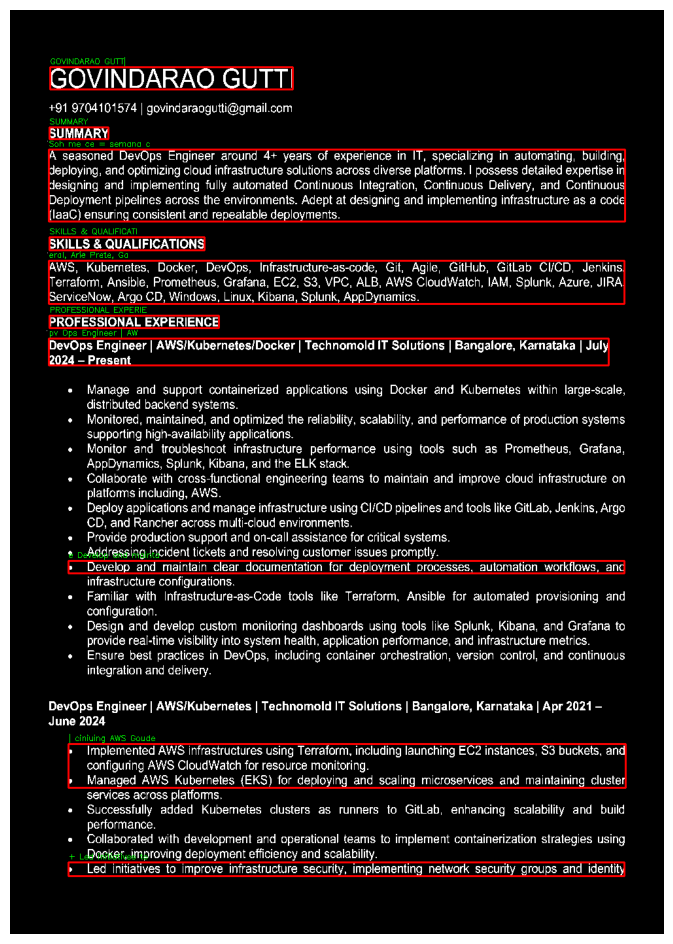

In [ ]:
import matplotlib.pyplot as plt

img_color = cv2.cvtColor(bw, cv2.COLOR_GRAY2BGR)
for c in cands[:10]:
    x1, y1, x2, y2 = map(int, [c['x1'], c['y1'], c['x2'], c['y2']])
    cv2.rectangle(img_color, (x1, y1), (x2, y2), (0, 0, 255), 2)
    if 'ocr' in c and c['ocr']:
        cv2.putText(img_color, c['ocr'][:20], (x1, max(0, y1-5)), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0,255,0), 1)

plt.figure(figsize=(10,12))
plt.imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


In [ ]:
SECTIONS = {
    "Summary": ["summary","professional summary","career summary","profile","about me","executive summary","personal profile","introduction","career objective","objective","professional profile","career overview","personal statement"],
    "Experience": ["experience","work experience","work history","professional experience","employment history","career history","relevant experience","industry experience","internship experience","practical experience","volunteer experience","freelance experience","project experience","consulting experience","military experience"],
    "Education": ["education","qualifications","academic background","academics","educational qualifications","academic qualifications","academic history","training and education","educational background","college education","schooling","coursework","academic achievements","research and education"],
    "Skills": ["skills","technical skills","key skills","technical expertise","core competencies","competencies","areas of expertise","professional skills","hard skills","soft skills","language skills","computer skills","programming languages","tools and technologies","methodologies","frameworks","strengths","capabilities","technical proficiency"],
    "Projects": ["projects","project highlights","key projects","selected projects","major projects","academic projects","research projects","open source projects","client projects","independent projects","case studies","portfolio projects","course projects","personal projects"],
    "Achievements": ["achievements","awards","honors","recognitions","distinctions","milestones","accomplishments","notable achievements","career highlights"],
    "Certifications": ["certifications","licenses","courses","training","professional development","workshops","online courses","continuing education","special training","technical certifications"],
    "Hobbies": ["hobbies","interests","personal interests","extracurricular activities","outside interests","personal pursuits","leisure activities"],
    "Publications": ["publications","research papers","journal articles","conference papers","books","book chapters","academic publications","white papers"],
    "Volunteer": ["volunteer","volunteering","community involvement","social work","philanthropy","community service","volunteer activities"],
    "Languages": ["languages","language proficiency","spoken languages","language skills"],
    "Research": ["research","research experience","research work","research summary","thesis","dissertation","research interests"],
    "References": ["references","referees","recommendations","testimonials"],
    "Public Speaking": ["public speaking","presentations","talks","seminars","conferences","speeches"],
    "Leadership": ["leadership","leadership experience","team leadership","management experience","organizational experience"],
    "Professional Development": ["professional development","training","workshops","seminars","courses"],
    "Memberships": ["memberships","professional memberships","associations","affiliations","societies","clubs"],
    "Patents": ["patents","intellectual property","inventions"],
    "Portfolio": ["portfolio","creative work","design portfolio","work samples","artwork"],
    "Objectives": ["objective","career objective","professional objective","goals","career goals","mission statement"],
    "Contact Information": ["contact information","contact details","personal details","bio","basic information"],
}


section_map = {}
for section, keywords in sections.items():
    for keyword in keywords:
        section_map[keyword] = section
